<hr style="border: 1px solid black; width: 100%; margin-left: 0">


<div style="text-align:right"> <b>University of Padua - Department of Physics and Astronomy<b> </div> 
<div style="text-align:right"> <strong> Degree course: </strong> Physics of Data</div>
<div style="text-align:right"><strong>Course: </strong>Laboratory of Computational Physics<b> </div>
<div style="text-align:right"><strong>Year: </strong>2023-2024<b> </div>
<div style="text-align:right"><strong>Teacher in charge: </strong>Zanetti Marco<b> </div>
    

#### Students:
- Cucchetto Filippo - 2110510 - filippo.cucchetto.1@studenti.unipd.it
- Simioni Federico      - 2097001 - federico.simioni@studenti.unipd.it
- Amorosetti Gabriel - 2107530 - gabriel.amorosetti@studenti.unipd.it
- Quaglio Emanuele - 2106975 - emanuele.quaglio@studenti.unipd.it
    
<strong>Exam Date</strong>: 21th  of March 2024
    
<center>
    
# Tracking muons with 4 Drift Tubes chambers setup
<center>
<hr style="border: 1px solid black; width: 100%; margin-left: 0">   

# Introduction

The project involved the analysis of data obtained from four drift-tube detectors during a beam test aimed at producing $\mu^+ - \mu^-$ pairs from collisions between a positron beam on a Beryllium target ($e^+ - e^-$). Each signal consists of two-dimensional trajectories, each crossing two of the aforementioned detectors (an effect due to the different curvature of trajectories belonging to particles of different charge due to the presence of a dipolar magnetic field). Among the data at our disposal, it is possible to distinguish between two different types of runs: 'calibration runs' and 'physics runs'. 

#### Calibration runs

The former are obtained by shooting directly $\mu^+$ at a given energy on the target, and are characterized by the presence of single trajectories along only one of the two sides (depending on the direction of the magnetic field). The different relevant parameter for those runs are listed here (the sign of the current characterizes the direction of the magnetic field):
| Run |  Energy (GeV)|  Magnet current (A)|
|-----|:---:|:-----:|
| 260 | 22 | -580 |
| 261 | 18 | -850 |
| 262 | 18 |  850 |
| 263 | 22 |  580 |

#### Physics runs

The second type of runs (the physics ones), on the other hand, present two trajectories but are characterized by the presence of a lot of noise (the sought-after event is very rare). 

#### Data format
The data files are organized as a series of events (rows) where each event consist of the coordinates of the hits recorded in that event (the number of hits is not fixed). More specifically every raw consists of:

* event number
* number of recorded hits (N)
* hit 1 coordinates
* ...
* hit N coordinates

where N could be zero too and the hits coordinates are: 
* *chamber*, which of the four detector registered the hit (numbering is in the range $0-4$)
* *layer*, which layer of that detector
* *xleft*, the x position of the hit in the local detector coordinates assuming the track passed at the left of the wire
* *xright*, the x position of the hit in the local detector coordinates assuming the track passed at the right of the wire
* *time*, the drift time (redundant)

The local detector coordinates are defined with respect to one side (the left one) of the detector. All the detectors however were placed rotated by 180 degrees, i.e. the x axes of the local and global coordinates have different orientation.

#### Procedure

Due to the rarity of the reactions of interest, we proceeded to implement an algorithm for selecting good events, considering the following outline:

PART 1: Setting up
- Data processing and positioning along an xz (global) plane
- Representation (for each event) of the four detectors, the hits, and the cells where the hits are located

PART 2: Reconstruction on calibration runs
- Selection of good events through conditions set on them
- Execution of a local linear fit on the hits in each detector
- Execution of a global linear fit on the combination of hits from the two detectors belonging to the same side
- Addition of the fit results among the shown events

PART 3: Reconstruction on physics run
- Same procedure as in part 2

# 1. Setting up

In [1]:
from time import time
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.patches import Rectangle
import os

In [2]:
np.set_printoptions(precision=3)
%precision 3
def print(*args):
    __builtins__.print(*("%.3f" % a if isinstance(a, float) else a
                         for a in args))

In [3]:
savefolder='plots'+str(int(time()))
os.mkdir(savefolder)

In the following block we define useful global variables. We begin by reporting the typical dimensions of the instrumental apparatus under consideration and the global coordinates of the origins of the various local reference systems of each detector.
In particular we represent each run as a `dictionary`, whose entries store informations about both the data files associated and some physical parameters about the run. Furthermore, one entry of the dictionary, `data_dict`, is itself another dictionary, which stores the collection of detection events of the run.

In [4]:
# Cell dimensions
XCELL = 42.
ZCELL = 13.

# X coordinates translation
global_x_shifts = [994.2, 947.4,-267.4,-261.5,]

# Z coordinates translations
local_z_shifts = [z*ZCELL for z  in range(0,4)]
global_z_shifts = [823.5, 0, 823.5, 0]

''' 
runs identifyed by 
    -'name': folder number
    -'files': start, stop, step numbering of files inside of the folder
    -configuration of chambers selected for a given run (chambers are numbered from 0 to 3) )
'''

# runs available to our analysis
run260={'name':260, 'files':(0,1,1), 'chamber_config': [2,3]}
run261={'name':261, 'files':(0,1,1), 'chamber_config': [2,3]}
run262={'name':262, 'files':(0,1,1), 'chamber_config': [0,1]}
run263={'name':263, 'files':(0,1,1), 'chamber_config': [0,1]}
run331={'name':331, 'files':(0,1046,1), 'chamber_config': [0,1,2,3]}
run332={'name':332, 'files':(29,1289,1), 'chamber_config': [0,1,2,3]}
run333={'name':333, 'files':(20,1586,5), 'chamber_config': [0,1,2,3]}

We import the dataset and store the non-null events in the dictionary `data_dict`, where the keys are `int` numbers indentifying each event, and the values associated are `pandas.DataFrame` objects storing the coordinates of all the event hits.

In [5]:
def data_dict_of_run(run):

    #creates the file paths
    half_path="./180904/Run"+str(run['name']).zfill(6)+"/data_"
    data_paths=[half_path+str(i).zfill(6)+'.txt' for i in range(*run['files'])]

    #best detectors configuration for a given run ([0,1], [2,3] or [0,1,2,3])
    chamber_config=run['chamber_config']

    data_dict={}
    false_events_counter=0
    for data_path in data_paths:
        with open(data_path) as data_file:
            for line in data_file:
                row=line.strip().split()
                key=int(row[0])
                n_hits=int(row[1])
                if n_hits!=0:
                    data_array=np.array(row[2:]).reshape((n_hits, 5))
                    event_dict={}
                    columns=['chamber', 'layer', 'xleft', 'xright', 'time']
                    for i in range(2):
                        event_dict[columns[i]]=data_array[:, i].astype(int)
                    for i in range(2,5):
                        event_dict[columns[i]]=data_array[:, i].astype(float)
                    value=pd.DataFrame(event_dict)
                    data_dict[key]=value
                else:
                    false_events_counter+=1
    original_data_length=len(data_dict)+false_events_counter
    print(f"[run {run['name']}] The total number of events in the original datatset is: {original_data_length}")
    print(f"[run {run['name']}] The percentage of the null events (events with 0 hits) w.r.t. the original amount of events is: {false_events_counter/(len(data_dict)+false_events_counter)*100}%")
    run['data_dict']=data_dict
    run['odl']=original_data_length
    run['n_zero_hit_events']=false_events_counter
    return data_dict

In [6]:
data_dict260=data_dict_of_run(run260)
print(run260)

[run 260] The total number of events in the original datatset is: 8182
[run 260] The percentage of the null events (events with 0 hits) w.r.t. the original amount of events is: 40.931312637496944%
{'name': 260, 'files': (0, 1, 1), 'chamber_config': [2, 3], 'data_dict': {1:    chamber  layer   xleft  xright   time
0        0      4  165.60  170.40   44.0
1        0      1  101.50  108.50   65.0
2        0      2  113.10  138.90  240.0
3        3      3   20.03   21.97   18.0
4        3      4   28.51   55.49  250.0
5        3      1   11.33   30.67  180.0, 2:    chamber  layer  xleft  xright   time
0        2      3  355.1   358.9   35.0
1        2      1  355.4   358.6   29.0
2        2      4  316.1   355.9  370.0
3        3      2  327.5   344.5  158.0
4        3      1  344.0   370.0  241.0
5        3      4  328.1   343.9  147.0
6        3      3  344.5   369.5  231.0, 4:     chamber  layer    xleft  xright   time
0         0      1  650.300  651.70   14.0
1         2      2  165.9

We add additional columns to each event `DataFrame` in order to store the global coordinates of the particle hits in a common reference frame for all the detector chambers:
* `'xrg'` labels the global $x$-coordinate (of a hit) located on the right of the wire at the center of the respective cell;
* `'xlg'` labels the global $x$-coordinate (of a hit) located on the left of the wire;
* `'zg'` labels the global $z$-coordinate of the wire;
* `'center'` labels the global $x$-coordinate of the wire;
* `'valid_hit'` is a column of `bool` values that can be modified to store the information of the validity of each hit according to multiple requirements.


In [7]:
def additional_columns(run):
    data_dict=run['data_dict']
    for event in data_dict.values():
        event['xrg']=event.apply(lambda df: global_x_shifts[int(df['chamber'])]-df['xleft'], axis=1)
        event['xlg']=event.apply(lambda df: global_x_shifts[int(df['chamber'])]-df['xright'], axis=1)
        event['zg']=event.apply(lambda df: global_z_shifts[int(df['chamber'])]-local_z_shifts[int(df['layer'])-1]+4*ZCELL-ZCELL/2, axis=1)
        event['center']=(event['xlg']+event['xrg'])/2
        event['valid_hit']=pd.Series(np.ones(len(event)).astype(bool))

In [8]:
additional_columns(run260)

For exemplification, we plot an event, representing the detector chambers in the $xz$-plane. In red and blu the `'xrg'` and `'xlg'` coordinates respectively.

In [9]:
#function that plots an event representing respectively in red and blue the xrg and xlg coordinates on the xz-plane, displaying the triggered cells.
def event_plotter_nofit(event_number, plot_ax=None):
    my_event=data_dict[event_number]
    x_centers, z_centers=(my_event['xlg']+my_event['xrg'])/2, my_event['zg']
    if plot_ax==None:
        fig, ax=plt.subplots(figsize=(12,10))
    else:
        ax=plot_ax

    #drawing the detectors   
    for i in range(4):
        x_origs=np.array(global_x_shifts)-700
        z_origs=global_z_shifts
        detector=Rectangle([x_origs[i], z_origs[i]], 700, 4*ZCELL, edgecolor='gray', facecolor='white')
        ax.add_artist(detector)

    #drawing the triggered cells
    for i in range(len(my_event)):
        rect=Rectangle([x_centers[i]-XCELL/2, z_centers[i]-ZCELL/2], XCELL, ZCELL, edgecolor='black', facecolor='white')
        ax.add_artist(rect)

    #drawing the points of hits
    dots_size=int(ax.get_position().width*20)+1
    ax.scatter(my_event['xlg'], my_event['zg'], color='blue', s=dots_size)
    ax.scatter(my_event['xrg'], my_event['zg'], color='red', s=dots_size)
    XRANGE=[-1000, 1000]
    YRANGE=[-100, 950]
    ax.set_xlim(XRANGE)
    ax.set_ylim(YRANGE)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    ax.set_xlabel('x [mm]', fontsize=15)
    ax.set_ylabel('z [mm]', fontsize=15)
    if plot_ax!=None:
        ax.set_title(f'Event {event_number}', size=16)

    if plot_ax==None:
        ax.set_title(f'[run {run["name"]}] Event {event_number}', size=16)
        plt.savefig(savefolder+'/nofit'+'_'+str(event_number)+'_'+str(run["name"])+'_'+str(int(time()))+'.pdf')
        plt.show()

In [10]:
#just an example of the rendering of an event.
event_plotter_nofit(30)
#multiple_plotter(list(run['data_dict'].keys()), event_plotter_nofit, max_number=6)

Since we are currently conducting a calibration run, the events of interest will pass through a pair of detectors positioned on one of the two sides (right or left). Consequently, we expect the distribution of hits to be notably concentrated on a particular side. To qualitatively highlight this aspect, we plot the distribution of the hits of the considered run on the $xz$ plane. Dots corresponding to hits belonging to the same event are the same color. Only the `xrg` coordinate is considered, for visualization purpose.

In [11]:
#function that plots the distribution of the hits of the considered run on the xz plane. Dots corresponding to hits belonging to the same event are the same color. Only the xrg coordinate is considered.
def hits_distribution(run):
    data_dict=run['data_dict']
    fig, ax=plt.subplots()
    'hits of the same event have the same color, only the `xrg` coordinate is considered'
    ax.set_title(f'[{run["name"]}] Hits distribution', fontsize=15)
    ax.set_xlabel('x [mm]')
    ax.set_ylabel('z [mm]')
    #drawing the detectors   
    for i in range(4):
        x_origs=np.array(global_x_shifts)-700
        z_origs=global_z_shifts
        detector=Rectangle([x_origs[i], z_origs[i]], 700, 4*ZCELL, edgecolor='gray', facecolor='white')
        ax.add_artist(detector)
    count=0
    max_event_number=max(data_dict.keys())
    min_event_number=min(data_dict.keys())
    for event_item in data_dict.items():
        event_number=event_item[0]
        event=event_item[1]
        ax.scatter(event['xrg'], event['zg'], color=plt.cm.Spectral(plt.Normalize(vmin=min_event_number, vmax=max_event_number)(event_number)), alpha=0.05, s=10)
        #ax.scatter(event['xrg'], event['zg'], color='red', alpha=0.2)
        #ax.plot((event.groupby('chamber').mean().reset_index()['xlg']+event.groupby('chamber').mean().reset_index()['xlg'])/2, event.groupby('chamber').mean().reset_index()['zg'], '-')
        count+=1
        #if(count>=100):
        #    break
        '''
        for hit in event:
            cells(center(hit))+=1
        '''
    #ax.set_xlim(-450, -405)

    plt.savefig(savefolder+'/hit_distr'+'_'+str(run["name"])+'_'+str(int(time()))+'.pdf')
    plt.show()

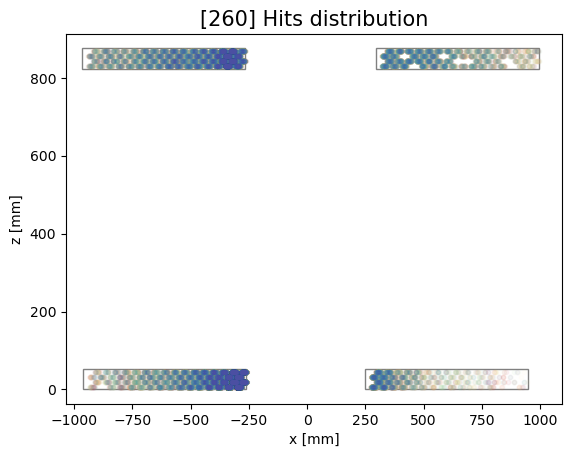

In [12]:
hits_distribution(run260)

As it is expected for the calibration runs, we observe a higher density of hits on a particular subset of the chambers. To confirm quantitatively such behaviour, below we plot the histogram showing the detectors involved in each event:

In [35]:
def plot_event_per_chamber_config(run):  
    data_dict=run['data_dict'] 
    fig,ax=plt.subplots(figsize=(12,7))
    bins, counts=(np.unique([str(sorted(np.unique(event['chamber']))) for event in data_dict.values()], return_counts=True))
    zipped=zip(counts, bins)
    sortedzipped=sorted(zipped, reverse=True)
    #print(sortedzipped)
    [counts, bins]=zip(*sortedzipped)
    #print(bins, counts)
    ax.bar(bins, counts, edgecolor='black')
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    ax.set_xlabel('detectors involved', fontsize=15)
    ax.set_ylabel('number of events', fontsize=15)
    ax.set_title(f'[run {run["name"]}] Number of events for any combination of triggered chambers', fontsize=15)
    fig.tight_layout()
    plt.savefig(savefolder+'/event_chamber'+'_'+str(run["name"])+'_'+str(int(time()))+'.pdf')
    plt.show()

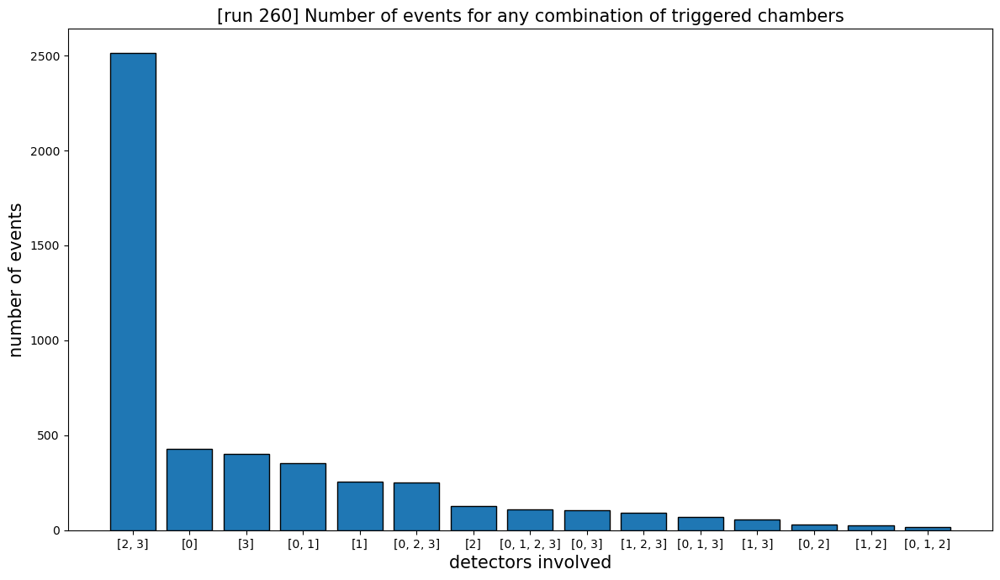

In [14]:
plot_event_per_chamber_config(run260)

As we can observe, the most frequent chamber configuration in this case is the [2,3], namely the left side, as expected from the sign of the magnetic current values reported in the introduction. The ability to appreciate this density stems from the relatively high percentage of good events in the calibration run. However, in the physics run, this is no longer feasible as noisy events are significantly dominant.

We proceed plotting the histogram of the number of events with a set number of hits:

In [15]:
def plot_n_hits_per_event(run, only_chamber_config=False): 
    data_dict=run['data_dict']
    if only_chamber_config==False:
        n_hits_per_event=[len(event) for event in data_dict.values()]
    else:
       n_hits_per_event=[len(event) for event in data_dict.values() if sorted(np.unique(event['chamber']))==run['chamber_config']] 
    average=np.mean(n_hits_per_event)
    mode=np.unique(n_hits_per_event)[np.argmax(np.unique(n_hits_per_event, return_counts=True)[1])]
    print(f'[run {run["name"]}] Average number of hits per event: {average}')
    print(f'[run {run["name"]}] Most frequent number of hits per event {mode}')
    plt.text(0.95,0.95,f'Mean {average:.2f}\nMode: {mode:.2f}', va='top', ha='right', transform=plt.gca().transAxes, fontsize=14, bbox=dict(facecolor='none', edgecolor='black'))
    plt.hist(n_hits_per_event, bins=(max(n_hits_per_event)-min(n_hits_per_event)), edgecolor='white', )
    #plt.hist(n_hits_per_event, edgecolor='gray')
    print()
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.xlabel('number of hits', fontsize=15)
    plt.ylabel('number of events', fontsize=15)
    plt.title(f'[run {run["name"]}] Number of events per number of hits'+['',f' in {run["chamber_config"]} events'][only_chamber_config], fontsize=14)
    plt.savefig(savefolder+'/hits_event'+['','_chamberconfig'][only_chamber_config]+'_'+str(run["name"])+'.pdf')
    plt.show()

[run 260] Average number of hits per event: 9.25512104283054
[run 260] Most frequent number of hits per event 8



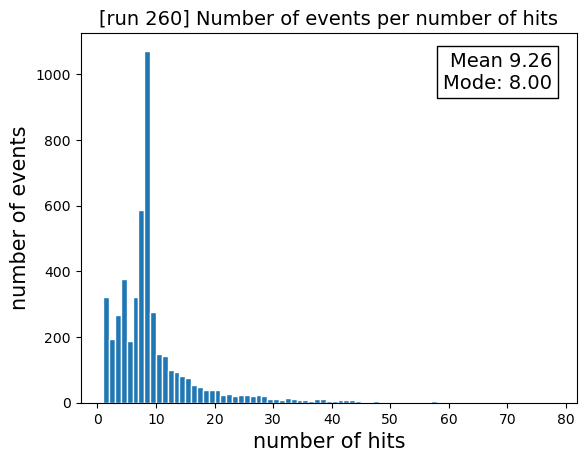

In [16]:
plot_n_hits_per_event(run260)

We repeat the plot, selecting only those events involving the detectors we are interested in (chamber configuration `[2,3]` for run 260):

[run 260] Average number of hits per event: 10.2441351888668
[run 260] Most frequent number of hits per event 8



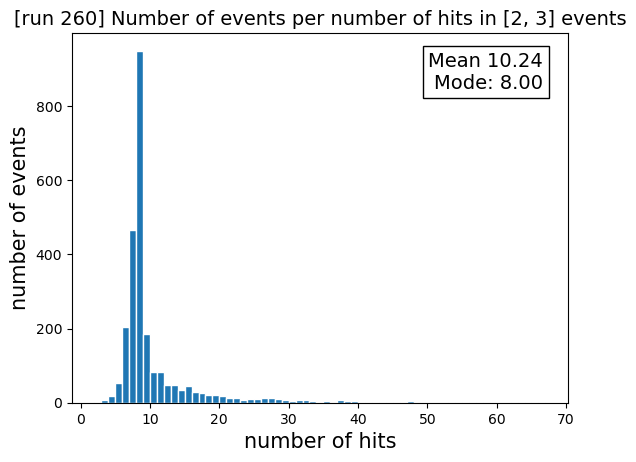

In [17]:
plot_n_hits_per_event(run260, only_chamber_config=True)

As it can be observed, the majority of events exhibit a hit count of 8, which can be interpreted as one hit per layer of both detectors (bearing in mind that each detector comprises 4 layers). The visualization of this graph already hints at the strategy to be pursued in the next paragraph, focusing on the selection of events to be considered valid. This latter aspect can indeed be viewed as the integral of the present histogram along the horizontal axis, and the trend can be helpful in developing the criteria to be applied (for further considerations, refer to the next paragraph dedicated to this aspect).

# 2. Reconstruction on calibration run

After qualitatively and quantitatively assessing the distribution of hits, we proceed with event selection using a multi-stage filtering approach.

Once this initial filtering stage is complete, selected events undergo the trajectory (or 'path') selection stage. Indeed, since for any hit two possible coordinates are stored (symmetrical to the wire of a detector cell), there is ambiguity in the trajectory choice. Furthermore, some hit records are due to noise and can interfere with the correct path selection. Our general strategy consists in choosing the most aligned points.

After performing this process we proceed with local fitting (one chamber) and global fitting (both left, or right, chambers) of the hit coordinates.

Given that certain plots exhibit a conspicuous discrepancy between local and global fits, we decide to veto these events using a threshold angle, beyond which events are discarded and returned to the previous step of trajectory path selection. In this second round, point selection occurs differently, favoring to some extent the choice of trajectories that are closer to a vertical alignment. Once this correction is applied, as we will see, some events display better fits and thus are recovered as good events, while the remaining ones are discarded.

In [18]:
from copy import deepcopy
run=deepcopy(run260)
chamber_config=run['chamber_config']
data_dict=run['data_dict']
original_data_length=run['odl']

For selecting the data, we define several filters. They are divided into 2 categories, named 'event filters' and 'hit filters', corresponding to two homonym functions that apply the filters on the dataset. 
* An `event_filter` takes as argument a list of event keys, and returns the subset of the events that passed certain selection criteria. It doesn't modify the dataset. Optionally, it computes and prints the percentage of events passing the filter w.r.t. the input list and the original dataset size.
* A `hit_filter` instead marks as 'non-valid' the hits that don't follow some criteria, modifying the `valid_hit` column of the respective `pandas.DataFrame`.
Notice that an `event_filter` can potentially process an event taking into account the 'validity' of each hit.
Thus, the order of application of the filters is important, because a different selection will change the outcome of filtering process. 

In [19]:
#filter applicators:

def event_filter(keys_list, e_filter, run, print_yield=True): #modifies the list of keys
    data_dict=run['data_dict']
    filter_yield=list(filter(lambda key : e_filter(data_dict[key]), keys_list))
    if print_yield==True:
        print(f"[run {run['name']}] Partial yield {len(filter_yield)/len(keys_list)*100}%\n", f"Global yield {len(filter_yield)/run['odl']*100}%")
    return filter_yield

def hit_filter(keys_list, h_filter, run): #modifies in place the 'valid_hit' column of dataset
    data_dict=run['data_dict']
    for key in keys_list:
        event=data_dict[key]
        #the "bad" filters return lists of "bad" hit indices, to be set to false. So the lists can just be concatenate with "+"
        bad_rows_indices_list=h_filter(event)
        #print('badrowsindices: ',key, bad_rows_indices_list)
        #print('before:', event)
        event.loc[bad_rows_indices_list,'valid_hit'] = False
        #print('after:', event)

Below are the various functions that define the *events filters* at our disposal. All these functions take a dataframe (belonging to the `data_dict` dictionary defined at the beginning) as input, and returns a `True` boolean i.f.f. the positive condition is met by the event.
* `desired_chamber_config` checks if the chambers involved in the event coincides with our desired chamber configuration. 
* `desired_chamber_config_only_valids` performs the same type of selection, with the difference that it only considers the `valid_hit` elements (see code below). 
* `at_least_three_layers_per_det` consideres only *valid hits*, groups them by `chamber` and then counts the number of layers present, checking if their number is at least 3. This filters automatically applies also the previous one (`desired_chamber_config_only_valids`).
* `max_one_hit_per_layer` performs a `groupby` based on the `'chamber'` and `'layer'` features, checking if the number of hits present in each layer is at most 1.
* `max_two_hits_per_layer` performs the same check as the previous filter but with a number of hits now equal to 2.
* `max_two_layers_with_more_than_one_hit` exploits a similar `groupby` approach to check that at most two layers recorded more than 1 hit.

In [20]:
#filters for event selection

#selects events with hits in a particular subset of detectors
def desired_chamber_config(event):
    return sorted(np.unique(event['chamber']))==chamber_config

#selects events with valid hits in a particular subset of detectors
def desired_chamber_config_only_valids(event):
    return sorted(np.unique(event[event['valid_hit']==True]['chamber']))==chamber_config

#selects events with...
def at_least_three_layers_per_det(event):
    return not np.any(event[event['valid_hit']==True].groupby('chamber')['layer'].nunique().reset_index()['layer']<3) and desired_chamber_config_only_valids(event)

def max_one_hit_per_layer(event):
    return not np.any(event.groupby(['chamber', 'layer']).count().reset_index()['time']>1)

def max_two_hits_per_layer(event):
    return not np.any(event.groupby(['chamber', 'layer']).count().reset_index()['time']>2)

def max_two_layers_with_more_than_one_hit(event):
    return not np.count_nonzero(event.groupby(['chamber', 'layer']).count().reset_index()['time']>1)>2

We define two other filtering functions:

The first function, `coordinates_outside_cell` , focuses on identifying hits with coordinates that fall outside a the cell width, which is denoted by `XCELL`. 
If the difference between `xleft` and `xright`  is greater than `XCELL` and the index of the corresponding hit and it is added to a list of indecies of the events which did not pass the filter.

The second function, `deviant_hit ` , targets hits that exhibit significant deviations from the mean x-coordinate of other hits within the same chamber. 

We define a threshold value,  `n_sigmas_treshold` , which determines the level of deviation considered significant. 

For each hit in the event, the function calculates the mean (`mu`) and standard deviation (`std`) of the x-coordinates of all hits within the same chamber, excluding the hit under evaluation. 

Subsequently, it compares the x-coordinate of each hit with the calculated mean. 

Hits whose x-coordinate deviates from the mean by more than a specified threshold. Which is defined as the greater value between: the product of `n_sigmas_treshold` `std` and XCELL. 
These event are considered bad events.
The function output is a list of indicies associated to these bad events.

In [21]:
#filters for (bad) hit selection

def coordinates_outside_cell(event):
    return list(event[np.abs(event['xleft']-event['xright'])>XCELL].index)

def deviant_hit(event): 
    n_sigmas_treshhold=2
    bad_indices=[]
    def other_hits_mu_std(out_index, event):
        index=list(event[event['chamber']==event.loc[out_index]['chamber']].index)
        index.remove(out_index)
        #print('index', index)
        return event.loc[index]['center'].mean(), event.loc[index]['center'].std() 
        
    for out_index, row in event.iterrows():
        #print('out_index', out_index)
        mu, std=other_hits_mu_std(out_index, event)
        #print(row['center'], mu, abs(row['center']-mu), n_sigmas_treshhold*std, XCELL)
        if abs(row['center']-mu)> max(n_sigmas_treshhold*std, XCELL):
            bad_indices.append(out_index)
    return bad_indices

Below we apply a precise succession of filters to our calibration datasets.
At first, we use the `max_one_hit_per_layer` 'event_filter', since it selects the most unambigous events that pose no problem to the fitting procedure. We show the results of this choice on the calibration run `run260`. Then, we swap it for the less strictly selective filter `max_two_layers_with_more_than_one_hit`, that shows good performance in terms of number of events selected and also in the quality of the resulting tracks as observed in the further analysis. 
Since the muon production from $e^+-e^-$ reaction is considered a "rare" event,we chose the latter filter, that allows us to consider a wider dataset.

In reference to the histogram '*Number of events per number of hits in [2,3] events*' presented in *Section 1*, regarding the number of events per hit count, it is noteworthy how the two filters correspond to integrating between 6 and 8 and between 6 and ~10 respectively (with reference to the horizontal axis, representing the bins). This observation quantitatively corroborates the considerations above, as the latter filter will encompass the entire main peak of the histogram under consideration, allowing us to minimize the discarding of potentially good events.

In [22]:
#FILTERS APPLICATION (both event_filters and hit_filters):
#NB: THE ORDER MATTERS!
chamber_config=run['chamber_config']
selected_events=event_filter(run['data_dict'].keys(), desired_chamber_config, run)
#selected_events=event_filter(selected_events, max_two_layers_with_more_than_one_hit, run)
selected_events=event_filter(selected_events, max_one_hit_per_layer, run)
hit_filter(selected_events, coordinates_outside_cell, run)
hit_filter(selected_events, deviant_hit, run)
selected_events=event_filter(selected_events, at_least_three_layers_per_det, run)

[run 260] Partial yield 52.03807159114422%
 Global yield 30.738205817648495%
[run 260] Partial yield 62.62425447316103%
 Global yield 19.249572231728184%
[run 260] Partial yield 86.28571428571429%
 Global yield 16.609630897091176%


We then define a set of functions, used to path reconstruction, we decided on two different approaches, the first one is a geometrically type and the second one is a statistical type.

The core of the first appraoch is based on the idea that a straight line is the one polygonal line that minimizes the differencese between internal angles, ideally resulting in a deviation of zero for a perfectly straight line.

Therefore we defined three functions: 

* `angle` : which just computes the angle of segment with extremes two different hits inside the chamber

* `zigzaginess`: The essence of this function lies in quantifying the irregularity of a path by measuring the squared differences between consecutive angles formed by segments connecting three consecutive hits along the path.

* `tanget_zigzaginess` : same thing of the other function just a different implementation which incorporates both angular deviations and segment lengths to provide a more nuanced assessment of path irregularity.


The statistical approach is based on the evaluation of the mean square error.

* `mse`: which computes the mean squared error (MSE) of a path. In particular utilizes linear regression (linregress) to fit a line to the data points, then it computes the squared differences between the observed x-coordinates and the corresponding predicted values from the linear regression model.
Finally it returns the average of these squared differences, representing the MSE.

Subsequently the `mse` function will be modified to take partially into account also the angle of the fitting line, that helps in individuating the right path.

In [23]:
from itertools import product
from math import atan2
from scipy.stats import linregress


def angle(A,B, C=None):
    #takes two points A and B with coordinates A=(xA,yA)... and return the angle on the plane in radiants
    #OR takes three points A, B, C with coordinates A=(xA,yA).. and return the difference angle BC^-AB^
    if C==None:
        return np.pi/2-atan2(A[1]-B[1], A[0]-B[0])
    else:
        difference=np.abs(angle(B,C)-angle(A,B))
        return min(2*np.pi-difference, difference)

def zigzaginess(path):
    try:
        if(len(path)>=3):
            squaresum=0
            for i in range(len(path)-2):
                A=path[i]
                B=path[i+1]
                C=path[i+2]
                squaresum+=(angle(B,C)-angle(A,B))**2
            return squaresum
        else:
            raise Exception("Error: path of less than 3 points")
    except Exception as err:
        print(err)
    
def tangent_zigzaginess(path):
    try:
        if(len(path)>=3):

            deviation_sum=0
            length_sum=0

            for i in range(len(path)-2):
                A=path[i]
                B=path[i+1]
                C=path[i+2]
                deviation_sum+=(atan2(B[0]-C[0], B[1]-C[1])-atan2(A[0]-B[0], A[1]-B[1]))**2
            deviation_weight=0

            for i in range(len(path)-1):
                A=path[i]
                B=path[i+1]
                length_sum+=(B[0]-A[0])**2+(B[1]-A[1])**2
            length_weight=1

            A,B,C,D=path[0], path[1], path[-2], path[-1]
            first_last_deviation=(atan2(C[0]-D[0], C[1]-D[1])-atan2(A[0]-B[0], A[1]-B[1]))**2
            fldev_weight=1

            return deviation_weight*deviation_sum+fldev_weight*first_last_deviation+length_weight*length_sum
        else:
            raise Exception("Error: path of less than 3 points")
    except Exception as err:
        print(err)


def mse(path):
    x,z=zip(*path)
    res=linregress(z,x)
    sum=0
    for i in range(len(x)):
        sum+=(x[i]-(res.slope*z[i]+res.intercept))**2
    return sum/len(x)

def opt_track(event, chamber):
    valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
    valid_subevent=valid_subevent.sort_values(by='zg')

    axes=[]
    for layer in np.sort(valid_subevent['layer'].unique()):
        axis=[]
        for index, row in valid_subevent[event['layer']==layer].iterrows():
            for coord in [row['xlg'], row['xrg']]:
                axis.append((coord, row['zg']))
        axes.append(axis)

    #axes=[['xrg', 'xlg']]*len(valid_subevent)
    paths=list(product(*axes))
    
    #paths=[[(np.array(valid_subevent[xc[i]])[i], np.array(valid_subevent['zg'])[i] ) for i in range(len(valid_subevent))] for xc in xcs]
    #sorting_function=(lambda path : abs(pearsonr(*zip(*path)).pvalue))
    #sorting_function=(lambda path : abs(np.corrcoef(*zip(*path))[0,1]))
    #straightness_function=lambda x: -tangent_zigzaginess(x)
    
    straightness_function=lambda x: -mse(x)
    best_path=max(paths, key=straightness_function)
    path_score=straightness_function(best_path)
    return best_path

We define then two plotting functions:

* 'event_plotter' : is designed to visualize the hits and fitted tracks within a single event. When called with a specific 'event_number', it retrieves the data for that event and generates a plot displaying the detector hits and fitted tracks.

* 'multiple_plotter': plot multiple events by calling it iteratively with different event numbers.

In [24]:
from matplotlib.patches import Rectangle
from scipy.stats import linregress

def event_plotter(event_number, plot_ax=None):
    my_event=data_dict[event_number]
    x_centers, z_centers=(my_event['xlg']+my_event['xrg'])/2, my_event['zg']
    if plot_ax==None:
        fig, ax=plt.subplots(figsize=(12,10))
    else:
        ax=plot_ax

    #drawing the detectors   
    for i in range(4):
        x_origs=np.array(global_x_shifts)-700
        z_origs=global_z_shifts
        detector=Rectangle([x_origs[i], z_origs[i]], 700, 4*ZCELL, edgecolor='gray', facecolor='white')
        ax.add_artist(detector)

    #drawing the triggered cells
    for i in range(len(my_event)):
        rect=Rectangle([x_centers[i]-XCELL/2, z_centers[i]-ZCELL/2], XCELL, ZCELL, edgecolor='black', facecolor='white')
        ax.add_artist(rect)

    #drawing the points of hits
    dots_size=int(ax.get_position().width*20)+1
    ax.scatter(my_event['xlg'], my_event['zg'], color='blue', s=dots_size)
    ax.scatter(my_event['xrg'], my_event['zg'], color='red', s=dots_size)
    XRANGE=[-1000, 1000]
    YRANGE=[-100, 950]
    ax.set_xlim(XRANGE)
    ax.set_ylim(YRANGE)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    ax.set_xlabel('x [mm]', fontsize=15)
    ax.set_ylabel('z [mm]', fontsize=15)
    if plot_ax!=None:
        ax.set_title(f'Event {event_number}', size=16)

    def tracker_fitter(in_line_chambers):
        #print('chamber:', in_line_chambers[0])
        (xu,zu)=zip(*opt_track(my_event, in_line_chambers[0]))
        #print('chamber:', in_line_chambers[1])
        (xd,zd)=zip(*opt_track(my_event, in_line_chambers[1]))
        x=np.concatenate([xu,xd])
        z=np.concatenate([zu,zd])

        resu=linregress(zu,xu)
        resd=linregress(zd,xd)
        res=linregress(z,x)

        xspace=np.linspace(*XRANGE, 1000)
        ax.plot(xspace, 1/resu.slope*xspace-resu.intercept/resu.slope, '--')
        ax.plot(xspace, 1/resd.slope*xspace-resd.intercept/resd.slope, '--')
        ax.plot(xspace, 1/res.slope*xspace-res.intercept/res.slope, color='black')
    
    for i in range(0,len(chamber_config),2):
        tracker_fitter(chamber_config[i:i+2])

    if plot_ax==None:
        ax.set_title(f'[run {run["name"]}] Event {event_number}', size=16)
        plt.savefig(savefolder+'/fit'+'_'+str(event_number)+'_'+str(run["name"])+'_'+str(int(time()))+'.pdf')
        plt.show()

Below we define a function that furtherly discriminates the selected events based on the risult of the local fits (that involve only hits in a single detector) and the global fit, that involves both detectors simultaneously. In particular, if at least one of the local fitting lines deviates from the global fitting line by an angle greater than a threshold (here set to $\pi/6$) that the track is considered ambiguous, and the event is deemed in the code as 'tricky'.

In [25]:
def event_filter_from_fit(event_number):

    event_is_tricky=False
    my_event=data_dict[event_number]
    x_centers, z_centers=(my_event['xlg']+my_event['xrg'])/2, my_event['zg']

    #criteria for trickyness 
    def angle_criterium(xu,zu,xd,zd,resu,resd,res):
        angle_thresh=np.pi/6
        return abs(np.arctan(resu.slope)-np.arctan(res.slope))>angle_thresh or abs(np.arctan(resd.slope)-np.arctan(res.slope))>angle_thresh
    
    def fit_compatibility_criterium(xu,zu,xd,zd,resu,resd,res):
        comp_index_thresh=3
        comp_index='...'
        return comp_index>comp_index_thresh
    
    #fits track after selection of optimal path
    def tracker_fitter(in_line_chambers):
        is_tricky=False
        #print('chamber:', in_line_chambers[0])
        (xu,zu)=zip(*opt_track(my_event, in_line_chambers[0]))
        #print('chamber:', in_line_chambers[1])
        (xd,zd)=zip(*opt_track(my_event, in_line_chambers[1]))
        x=np.concatenate([xu,xd])
        z=np.concatenate([zu,zd])

        resu=linregress(zu,xu)
        resd=linregress(zd,xd)
        res=linregress(z,x)

        #if abs(resu.slope)>ang_coef_tresh or abs(resd.slope)>ang_coef_tresh: event_is_tricky=True
        if angle_criterium(xu,zu,xd,zd,resu,resd,res): is_tricky=True
        #ax.plot(xu,zu)
        #ax.plot(xd,zd)
        return is_tricky
    
    for i in range(0,len(chamber_config),2):
        is_tricky=tracker_fitter(chamber_config[i:i+2])
        if is_tricky: event_is_tricky=True
    #print(event_number)
    #print(my_event)

    return event_number, event_is_tricky

In [26]:
#takes as input a list of event_numbers, and max number of events plottable
def multiple_plotter(events_idlike_to_plot, plotter_function= event_plotter, max_number=98):
    if len(events_idlike_to_plot) > max_number:
        events_to_plot=events_idlike_to_plot[:max_number]
    else:
        events_to_plot=events_idlike_to_plot
    n_plots=len(events_to_plot)
    n_cols=3
    fig,axes=plt.subplots(ncols=n_cols, nrows=n_plots//n_cols+1, figsize=(14,(14/n_cols)*(n_plots//n_cols+1)))
    fig.suptitle(f'[run {run["name"]}] Selected events', fontsize=16, weight='bold', x=0.5, y=1) 
    plt.subplots_adjust(top=1)
    plt.subplots_adjust(bottom=0.1)
    k=0
    for ax in axes.reshape(-1):
        if(k<len(events_to_plot)):
            plotter_function(events_to_plot[k], plot_ax=ax)
        else:
            ax.axis('off')
        k+=1
    
    fig.tight_layout()
    plt.savefig(savefolder+'/fit'+'_'+str(run["name"])+'_'+str(int(time()))+'.pdf')
    plt.show()

The following function allows to store the list of events that show good and bad agreement between local and global fit.

In [27]:
def good_and_tricky_events_filter_from_fit(input_events):
    tricky_events=[]
    for event_n in input_events:
        event_number, event_is_tricky=event_filter_from_fit(event_n)
        if event_is_tricky:
            tricky_events.append(event_number)
    good_events=[item for item in input_events if item not in tricky_events]
    print(f'[run {run["name"]}] {len(tricky_events)} TRICKY EVENTS: ', tricky_events)
    print(f'[run {run["name"]}] Input events: {len(input_events)}')
    print(f'[run {run["name"]}] Post-fit selected events: {len(input_events)-len(tricky_events)}')
    print(f'[run {run["name"]}] Percentage of input events showing good agreements between local and global fit: {(len(input_events)-len(tricky_events))/len(input_events)*100}%')
    print(f'[run {run["name"]}] Percentage w.r.t. original dataset size: {(len(input_events)-len(tricky_events))/original_data_length*100}%')
    return good_events, tricky_events

Below we plot the events deemed 'good' after comparing the local and global fit.

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 260] 10 TRICKY EVENTS:  [1902, 2091, 3548, 3714, 3862, 3904, 5145, 6547, 7283, 7353]
[run 260] Input events: 1359
[run 260] Post-fit selected events: 1349
[run 260] Percentage of input events showing good agreements between local and global fit: 99.26416482707874%
[run 260] Percentage w.r.t. original dataset size: 16.487411390857982%


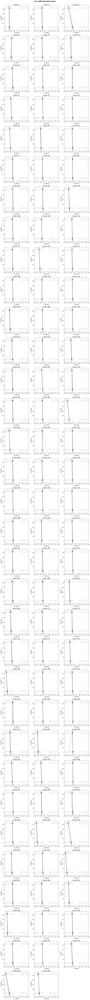

In [28]:
good_events, tricky_events = good_and_tricky_events_filter_from_fit(selected_events)

multiple_plotter(good_events)

Now, we plot the 'tricky' events, i.e. the trajectories resulting ambiguous to reconstruct after comparing the local and global fits.

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


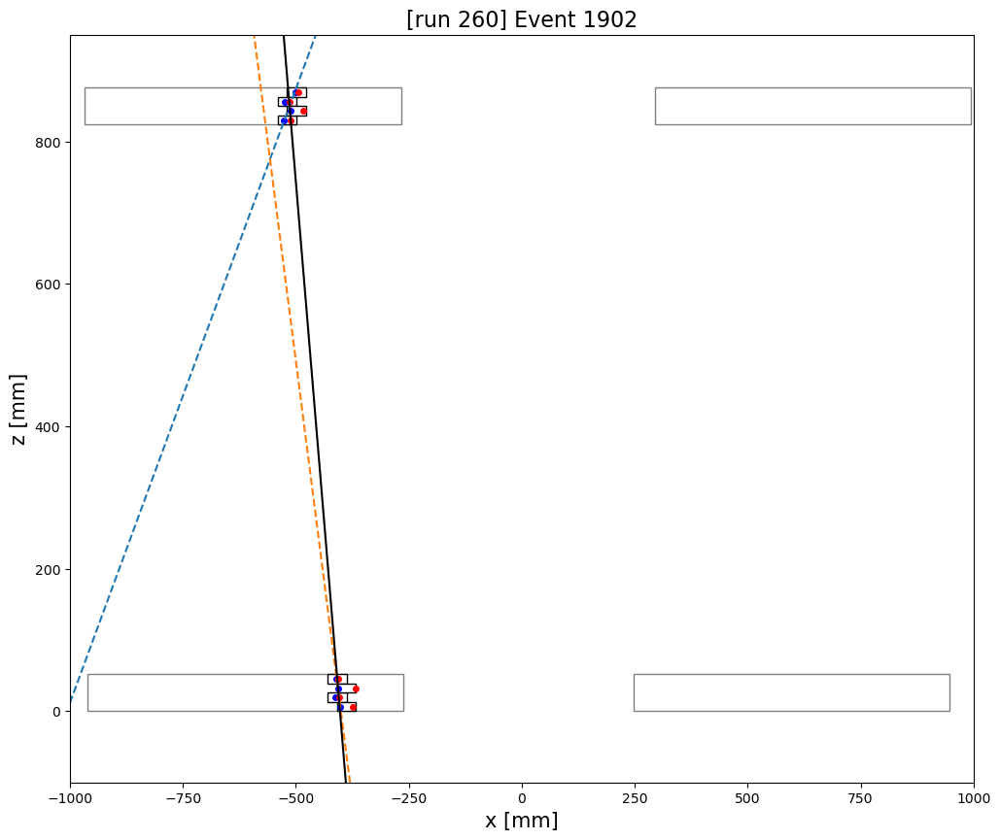

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


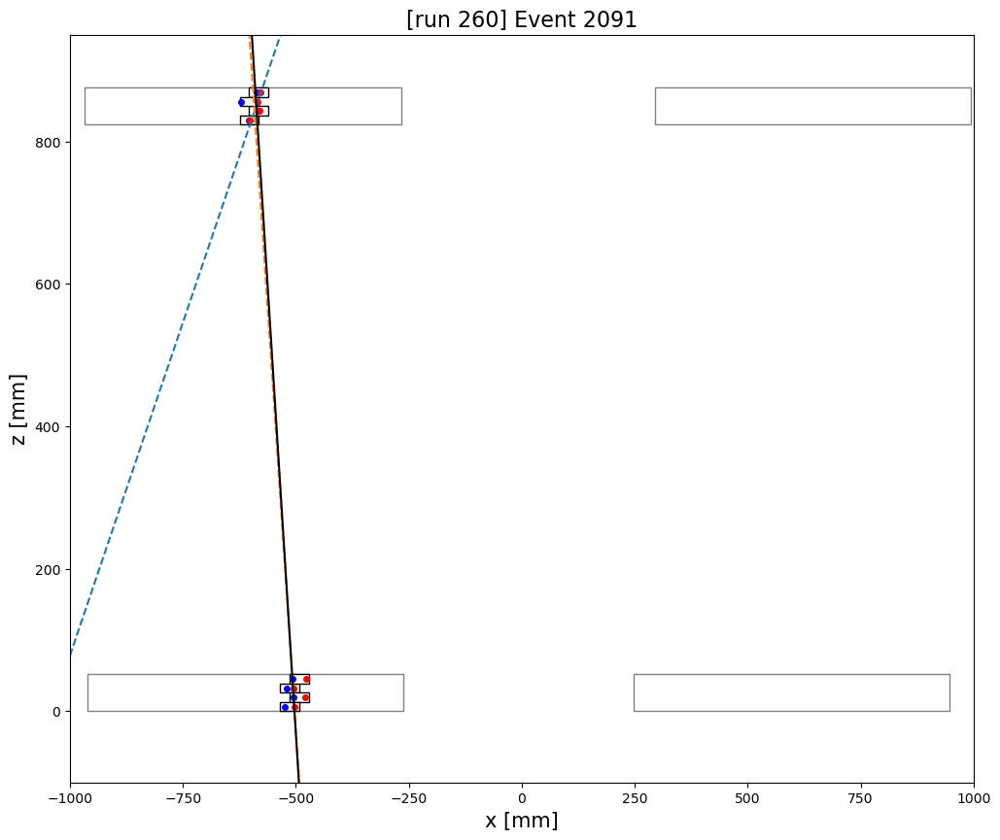

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


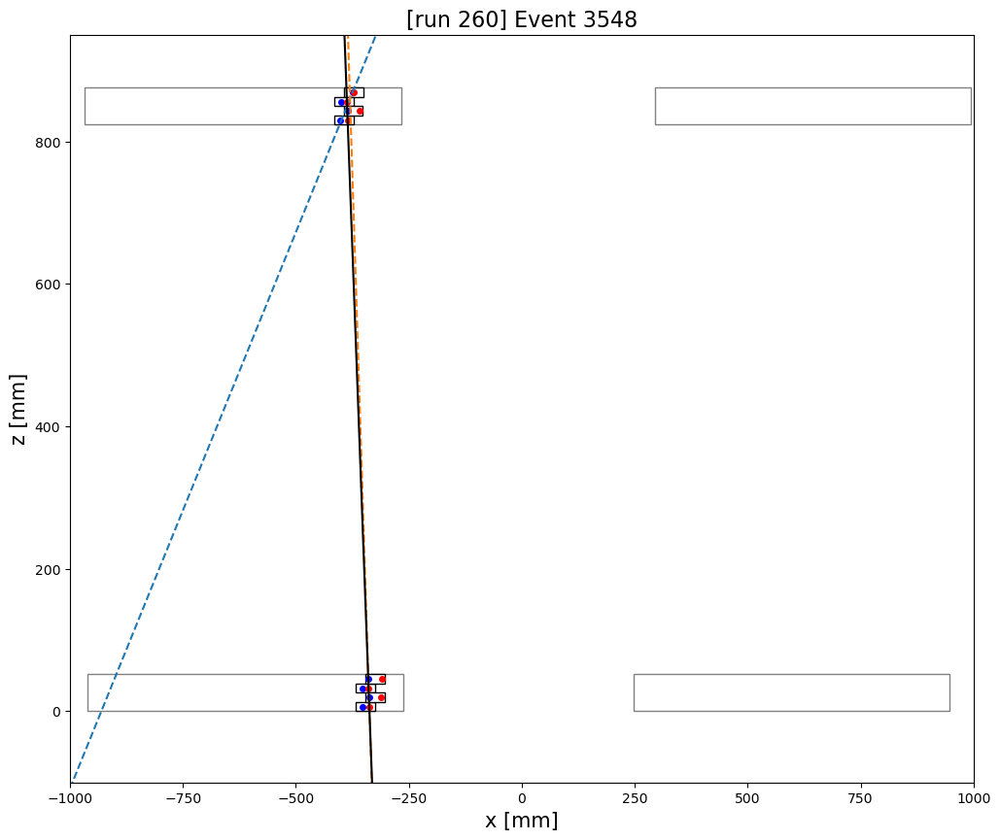

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


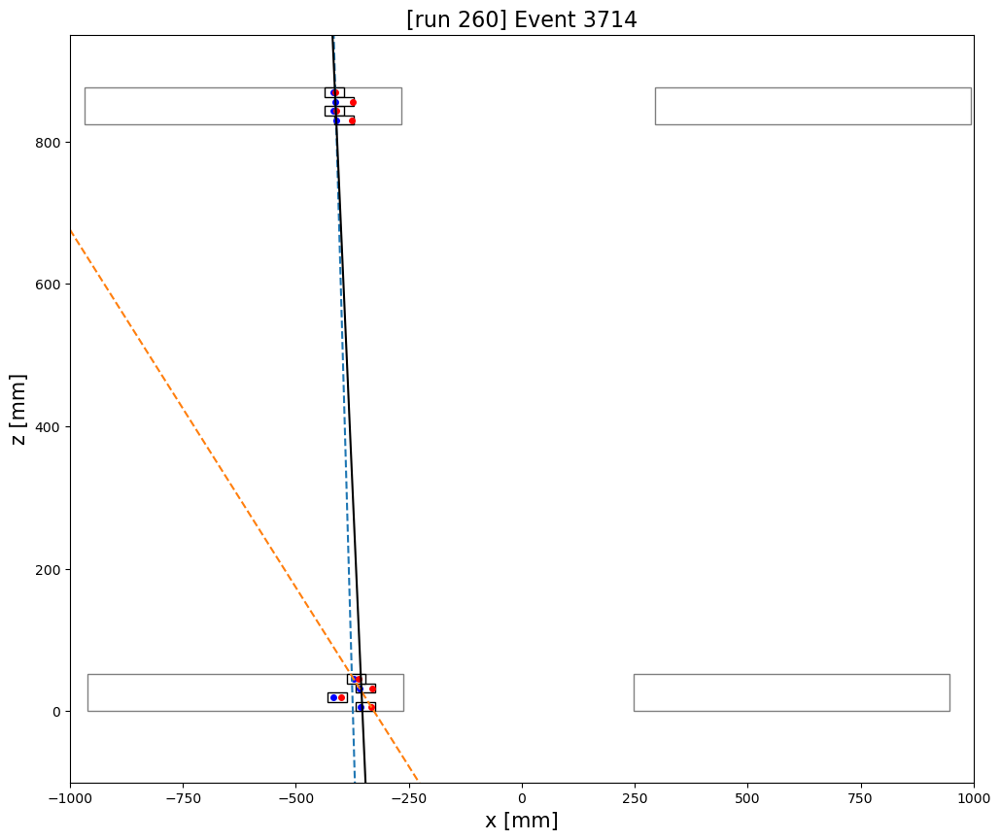

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


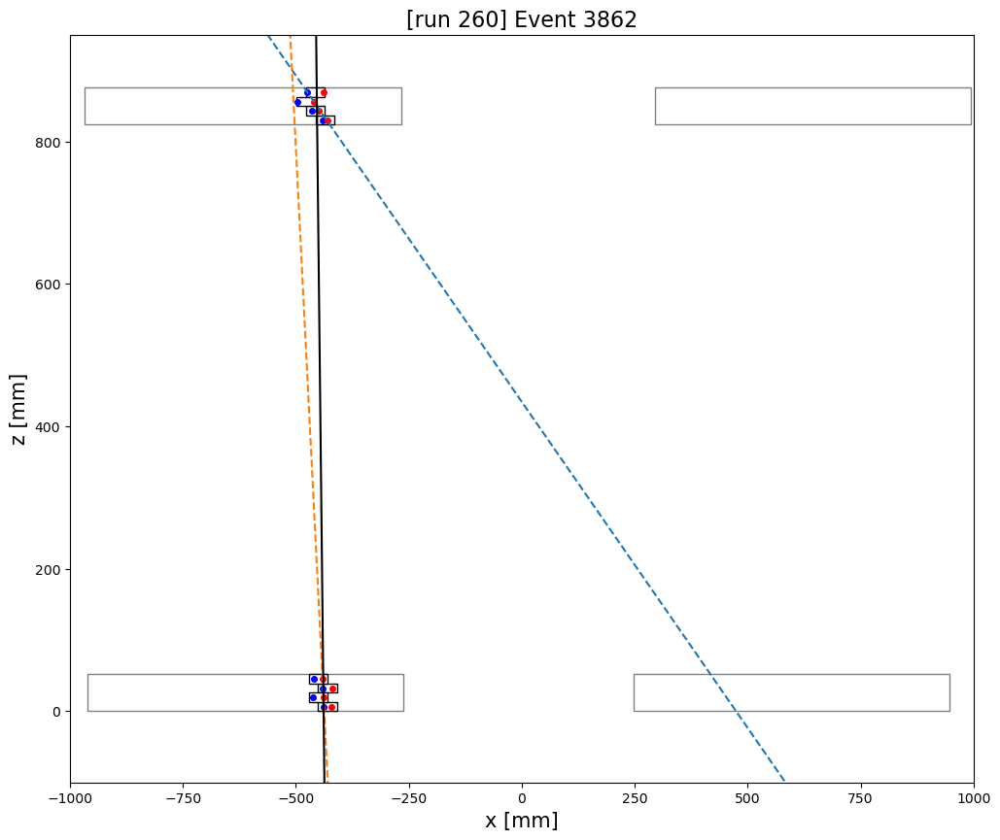

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


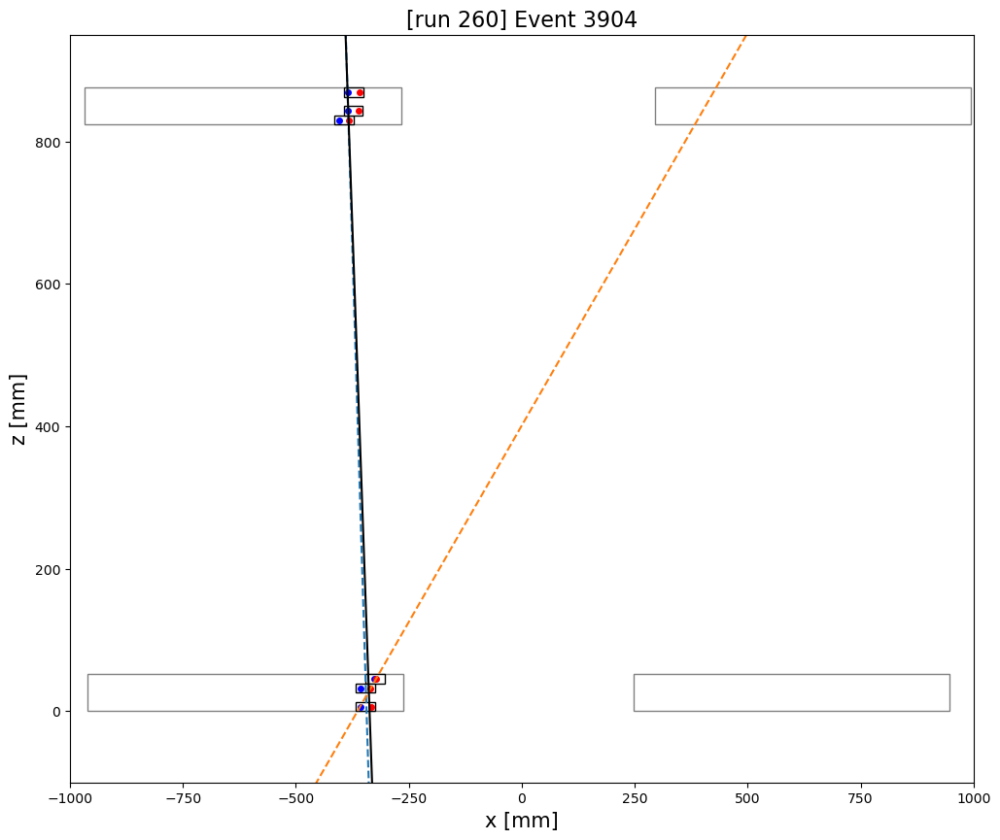

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


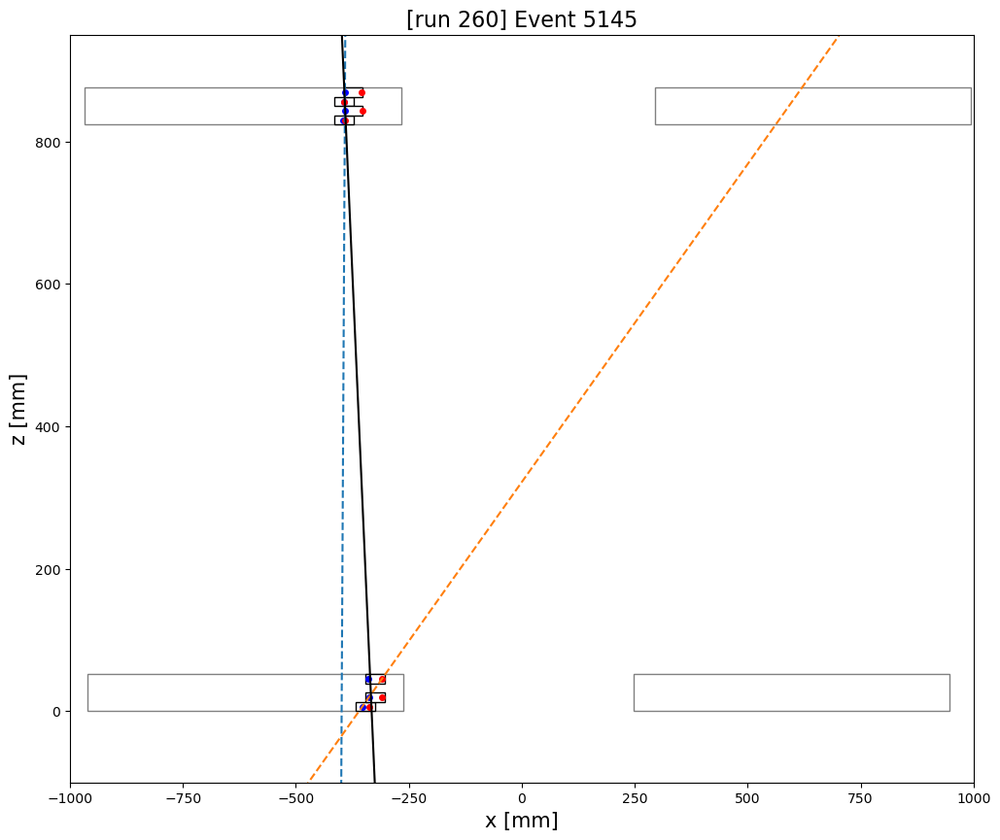

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


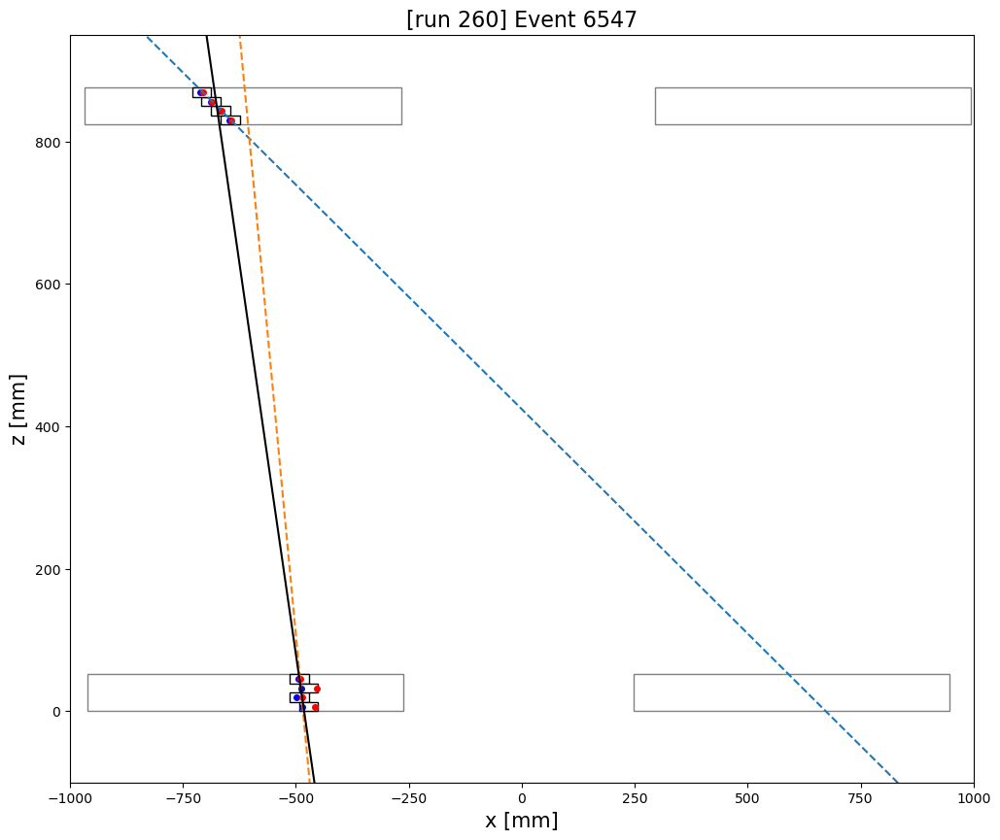

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


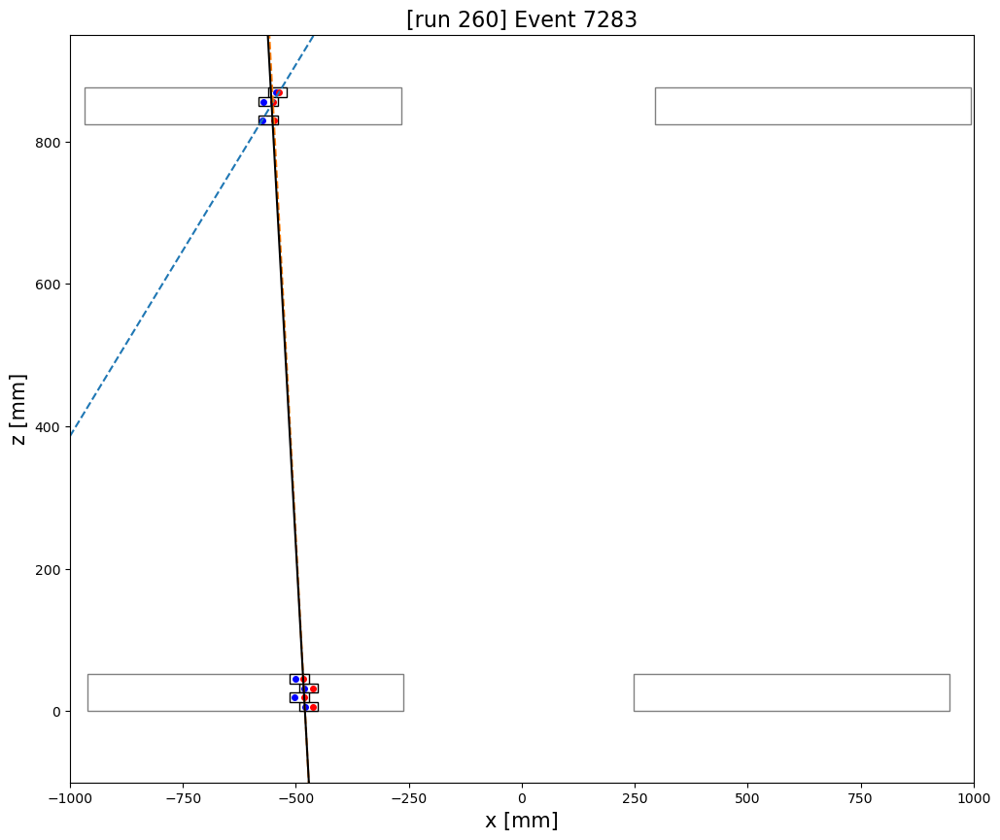

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


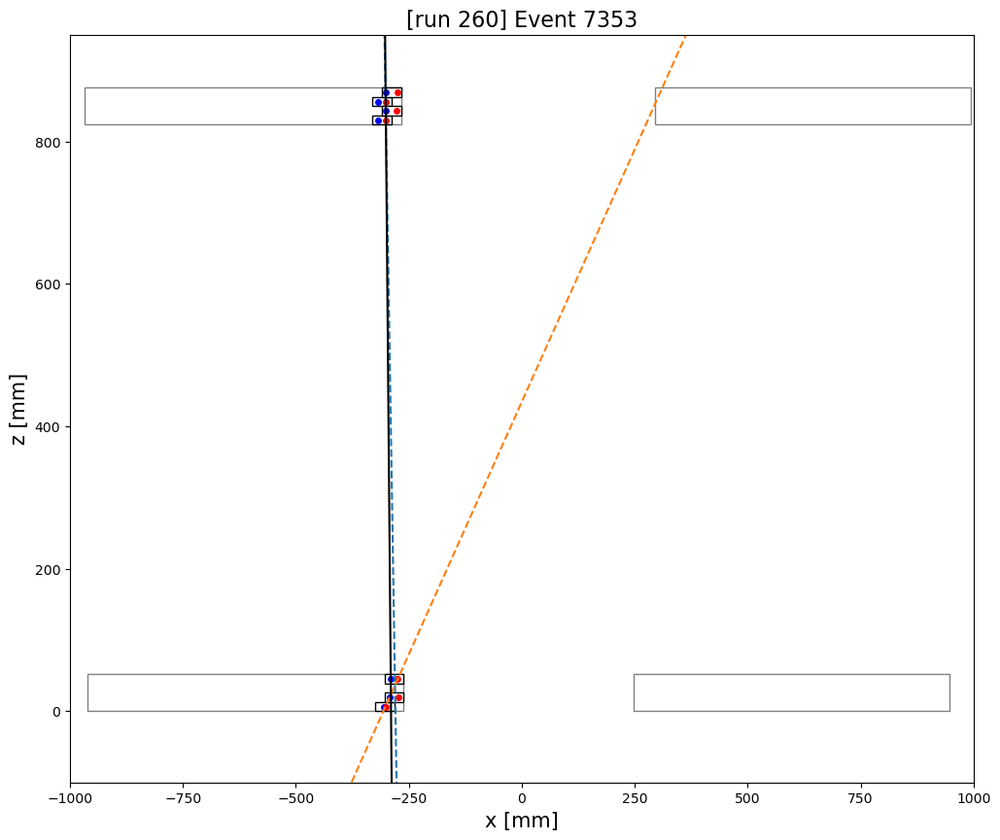

In [29]:
for number_to_check in tricky_events:
    event_plotter(number_to_check)

We reconsider only the tricky events and apply a different path selection algorithm that rewards, on top of the most linear paths, also a better compatibility of the local fit with the assumption that the muon trajectory is likely vertical in the  $xz$-plane. To do that we redefine the 'cost function' that evaluates the goodness of a path, declaring a global variable `'vericality_weight'` that acts as a parameter and lets us modulate the impact of this new term of the cost. 

In [30]:

VERTICALITY_WEIGHT=10

def mse(path):
    x,z=zip(*path)
    res=linregress(z,x)
    sum=0
    for i in range(len(x)):
        sum+=(x[i]-(res.slope*z[i]+res.intercept))**2
    return sum/len(x)+VERTICALITY_WEIGHT*(res.slope)**2 #res.slope is prop to comp_index between fit slope and average global (vertical fit)

Below, we display those 'tricky' events whose local fitting lines becom compatible with the global ones after the different path selection implementation, and we visually compare them with the plots above. 

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 260] 5 TRICKY EVENTS:  [2091, 3862, 3904, 6547, 7353]
[run 260] Input events: 10
[run 260] Post-fit selected events: 5
[run 260] Percentage of input events showing good agreements between local and global fit: 50.0%
[run 260] Percentage w.r.t. original dataset size: 0.06110975311659741%


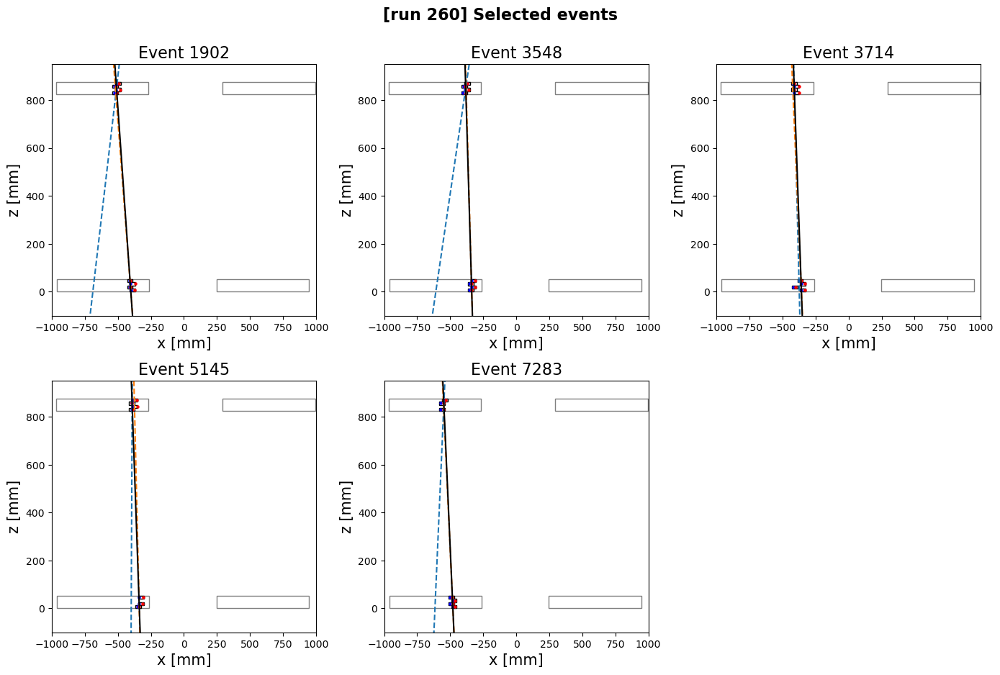

In [31]:
eventually_good_events, still_tricky_events=good_and_tricky_events_filter_from_fit(tricky_events)
if (len(eventually_good_events)>0):
    multiple_plotter(eventually_good_events)

A good percentage (50%) of the previously discarded events are now recovered as good. Therefore, we decide to apply this strategy of post-fit recovering also in the physics runs.

To obtain a comparison with an alternative method, we decide to repeat, on the run260, the same procedure just described using the `max_two_layers_with_more_than_one_hit` filter. The aim is to select the greatest number of potentially good events, and the results obtained are reported subsequently. As can be seen, this allows an increase in the number of good events, and given the results obtained, we decide to retain this latter method for all other calibration runs and for the physics run as well.

In [32]:
run=run260
data_dict260=data_dict_of_run(run)
additional_columns(run)
hits_distribution(run)
plot_event_per_chamber_config(run)
plot_n_hits_per_event(run)
plot_n_hits_per_event(run, only_chamber_config=True)

chamber_config=run['chamber_config']
data_dict=run['data_dict']
original_data_length=run['odl']

selected_events=event_filter(run['data_dict'].keys(), desired_chamber_config, run)
selected_events=event_filter(selected_events, max_two_layers_with_more_than_one_hit, run)
hit_filter(selected_events, coordinates_outside_cell, run)
hit_filter(selected_events, deviant_hit, run)
selected_events=event_filter(selected_events, at_least_three_layers_per_det, run)
VERTICALITY_WEIGHT=0
good_events, tricky_events = good_and_tricky_events_filter_from_fit(selected_events)
multiple_plotter(good_events)
multiple_plotter(good_events, max_number=6)
print(f'[run {run["name"]}] Events considered uncertain after comparison of local and global fitting')
for number_to_check in tricky_events:
    event_plotter(number_to_check)
multiple_plotter(tricky_events)
VERTICALITY_WEIGHT=10
eventually_good_events, still_tricky_events=good_and_tricky_events_filter_from_fit(tricky_events)
if (len(eventually_good_events)>0):
    for number_to_check in eventually_good_events:
        event_plotter(number_to_check)
    multiple_plotter(eventually_good_events)

'\nrun=run260\ndata_dict260=data_dict_of_run(run)\nadditional_columns(run)\nhits_distribution(run)\nplot_event_per_chamber_config(run)\nplot_n_hits_per_event(run)\nplot_n_hits_per_event(run, only_chamber_config=True)\n\nchamber_config=run[\'chamber_config\']\ndata_dict=run[\'data_dict\']\noriginal_data_length=run[\'odl\']\n\nselected_events=event_filter(run[\'data_dict\'].keys(), desired_chamber_config, run)\nselected_events=event_filter(selected_events, max_two_layers_with_more_than_one_hit, run)\nhit_filter(selected_events, coordinates_outside_cell, run)\nhit_filter(selected_events, deviant_hit, run)\nselected_events=event_filter(selected_events, at_least_three_layers_per_det, run)\nVERTICALITY_WEIGHT=0\ngood_events, tricky_events = good_and_tricky_events_filter_from_fit(selected_events)\nmultiple_plotter(good_events)\nmultiple_plotter(good_events, max_number=6)\nprint(f\'[run {run["name"]}] Events considered uncertain after comparison of local and global fitting\')\nfor number_to_ch

## Remaining calibration runs

In [33]:
savefolder='plots'+str(int(time()))
os.mkdir(savefolder)
parentsavefolder=savefolder


for run in [run260, run261,run262,run263]:
    data_dict260=data_dict_of_run(run)
    additional_columns(run)
    
    savefolder=os.path.join(parentsavefolder,'part1')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    hits_distribution(run)
    plot_event_per_chamber_config(run)
    plot_n_hits_per_event(run)
    plot_n_hits_per_event(run, only_chamber_config=True)

    chamber_config=run['chamber_config']
    data_dict=run['data_dict']
    original_data_length=run['odl']

    selected_events=event_filter(run['data_dict'].keys(), desired_chamber_config, run)
    selected_events=event_filter(selected_events, max_two_layers_with_more_than_one_hit, run)
    #selected_events=event_filter(selected_events, max_one_hit_per_layer, run)
    hit_filter(selected_events, coordinates_outside_cell, run)
    hit_filter(selected_events, deviant_hit, run)
    selected_events=event_filter(selected_events, at_least_three_layers_per_det, run)
    VERTICALITY_WEIGHT=0
    good_events, tricky_events = good_and_tricky_events_filter_from_fit(selected_events)

    savefolder=os.path.join(parentsavefolder,'good')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    multiple_plotter(good_events)
    multiple_plotter(good_events, max_number=6)

    print(f'[run {run["name"]}] Events considered uncertain after comparison of local and global fitting')

    savefolder=os.path.join(parentsavefolder,'tricky')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    for number_to_check in tricky_events:
        event_plotter(number_to_check)
    multiple_plotter(tricky_events)

    VERTICALITY_WEIGHT=10
    eventually_good_events, still_tricky_events=good_and_tricky_events_filter_from_fit(tricky_events)

    savefolder=os.path.join(parentsavefolder,'eventually_good')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    if (len(eventually_good_events)>0):
        for number_to_check in eventually_good_events:
            event_plotter(number_to_check)
        multiple_plotter(eventually_good_events)


'\nsavefolder=\'plots\'+str(int(time()))\nos.mkdir(savefolder)\nparentsavefolder=savefolder\n\n\nfor run in [run260, run261,run262,run263]:\n    data_dict260=data_dict_of_run(run)\n    additional_columns(run)\n    \n    savefolder=os.path.join(parentsavefolder,\'part1\')\n    if (not os.path.exists(savefolder)): \n        os.mkdir(savefolder)\n\n    hits_distribution(run)\n    plot_event_per_chamber_config(run)\n    plot_n_hits_per_event(run)\n    plot_n_hits_per_event(run, only_chamber_config=True)\n\n    chamber_config=run[\'chamber_config\']\n    data_dict=run[\'data_dict\']\n    original_data_length=run[\'odl\']\n\n    selected_events=event_filter(run[\'data_dict\'].keys(), desired_chamber_config, run)\n    selected_events=event_filter(selected_events, max_two_layers_with_more_than_one_hit, run)\n    #selected_events=event_filter(selected_events, max_one_hit_per_layer, run)\n    hit_filter(selected_events, coordinates_outside_cell, run)\n    hit_filter(selected_events, deviant_hit,

# 3. Reconstruction on physics runs

[run 331] The total number of events in the original datatset is: 34428
[run 331] The percentage of the null events (events with 0 hits) w.r.t. the original amount of events is: 19.50737771581271%


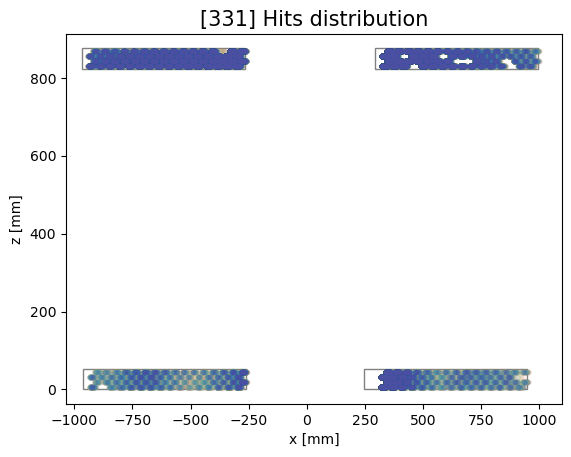

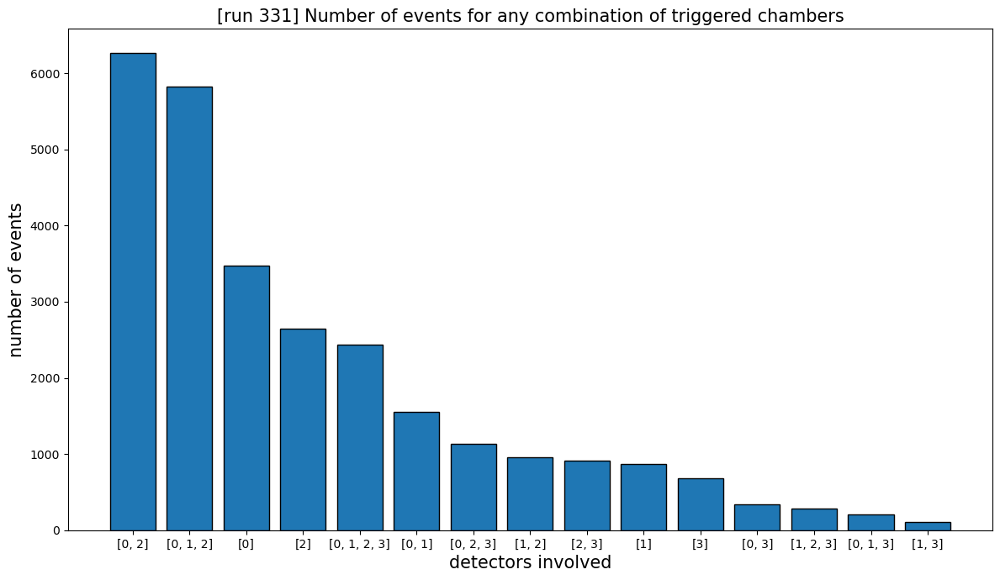

[run 331] Average number of hits per event: 13.418410796766743
[run 331] Most frequent number of hits per event 1



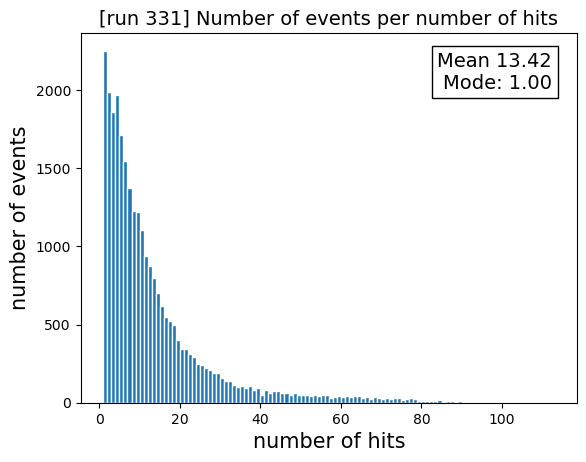

[run 331] Average number of hits per event: 38.616707616707615
[run 331] Most frequent number of hits per event 14



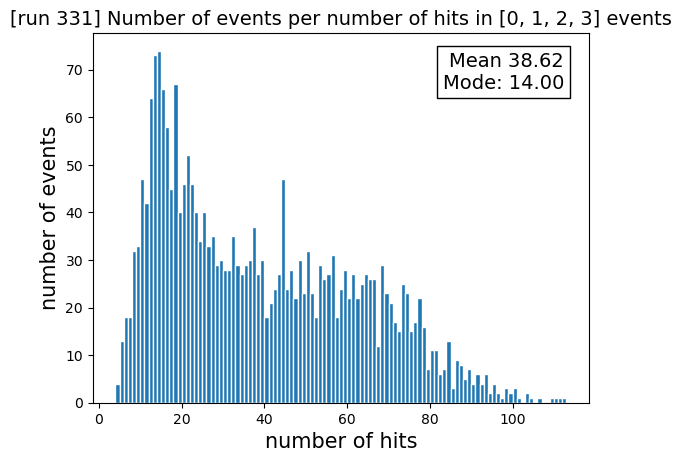

[run 331] Partial yield 8.812066974595844%
 Global yield 7.093063785291043%
[run 331] Partial yield 14.086814086814087%
 Global yield 0.999186708493087%
[run 331] Partial yield 9.30232558139535%
 Global yield 0.09294760079005461%


/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 331] 3 TRICKY EVENTS:  [22821, 26388, 46945]
[run 331] Input events: 32
[run 331] Post-fit selected events: 29
[run 331] Percentage of input events showing good agreements between local and global fit: 90.625%
[run 331] Percentage w.r.t. original dataset size: 0.084233763215987%


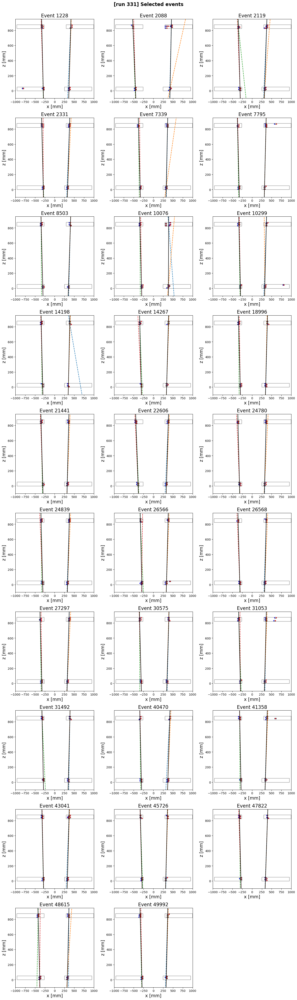

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


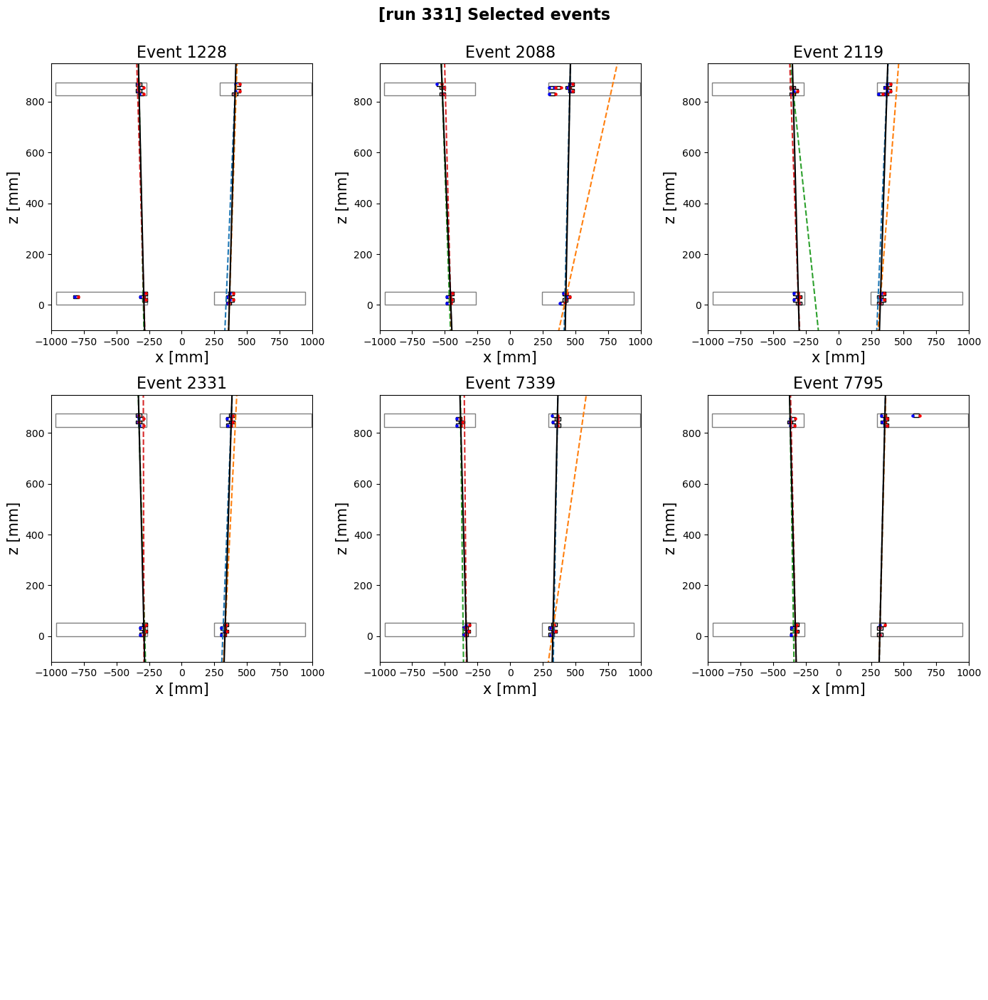

[run 331] Events considered uncertain after comparison of local and global fitting


/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


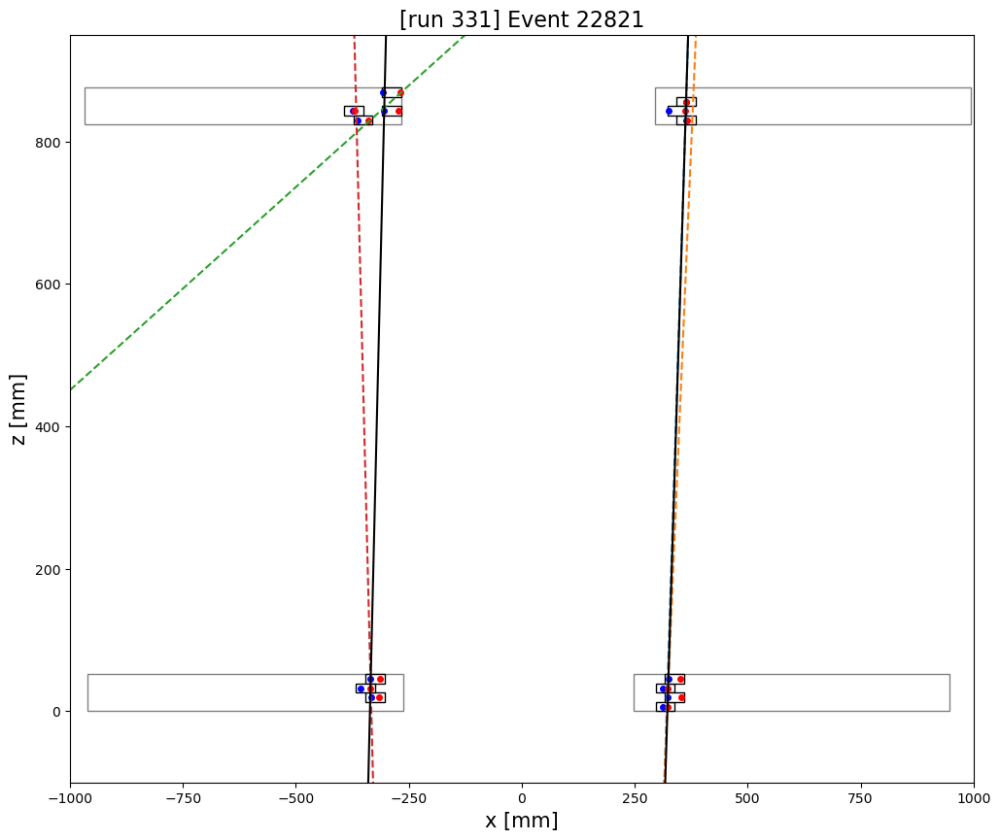

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


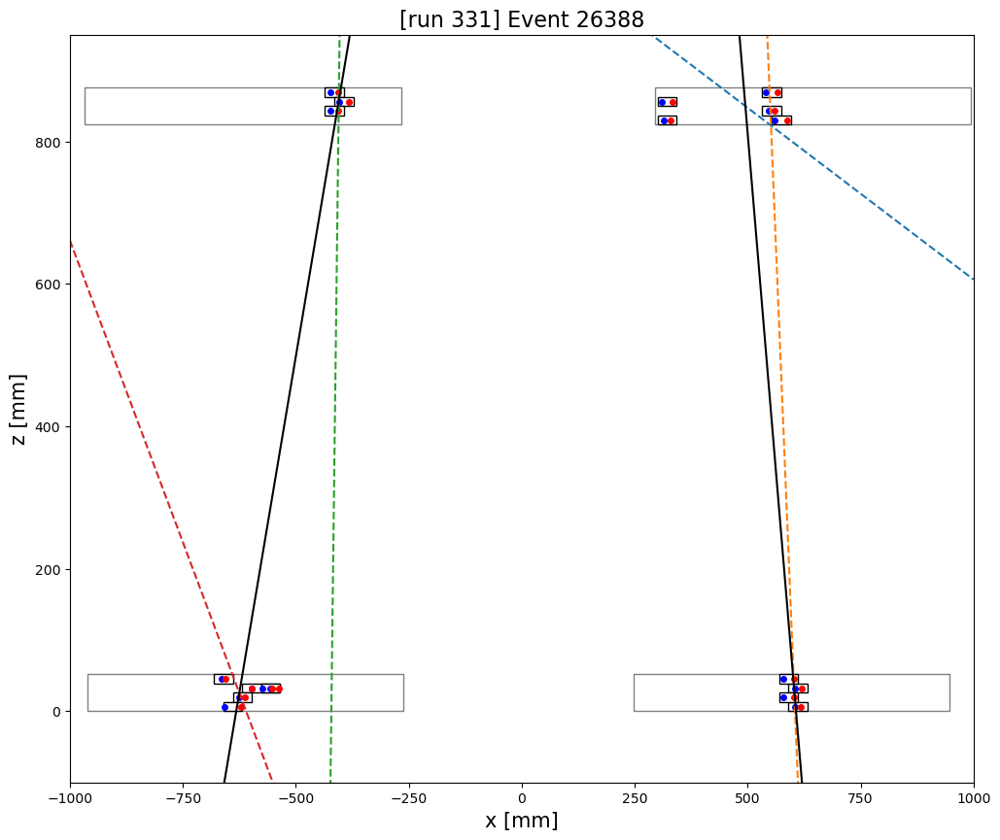

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


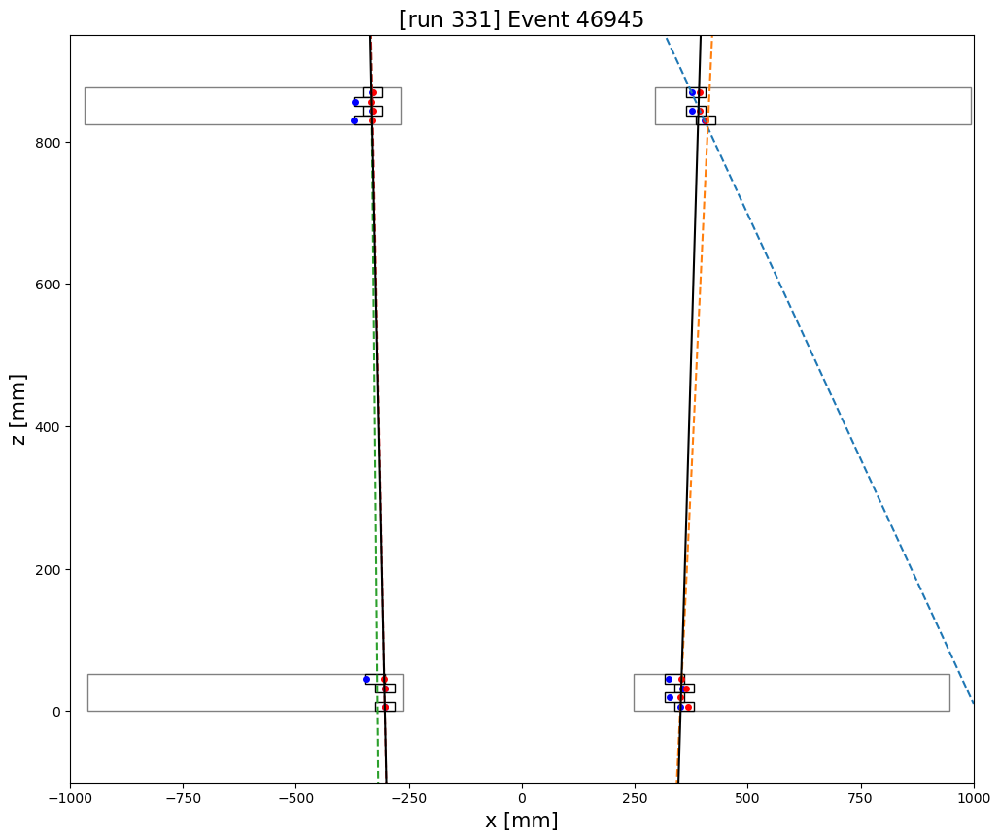

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


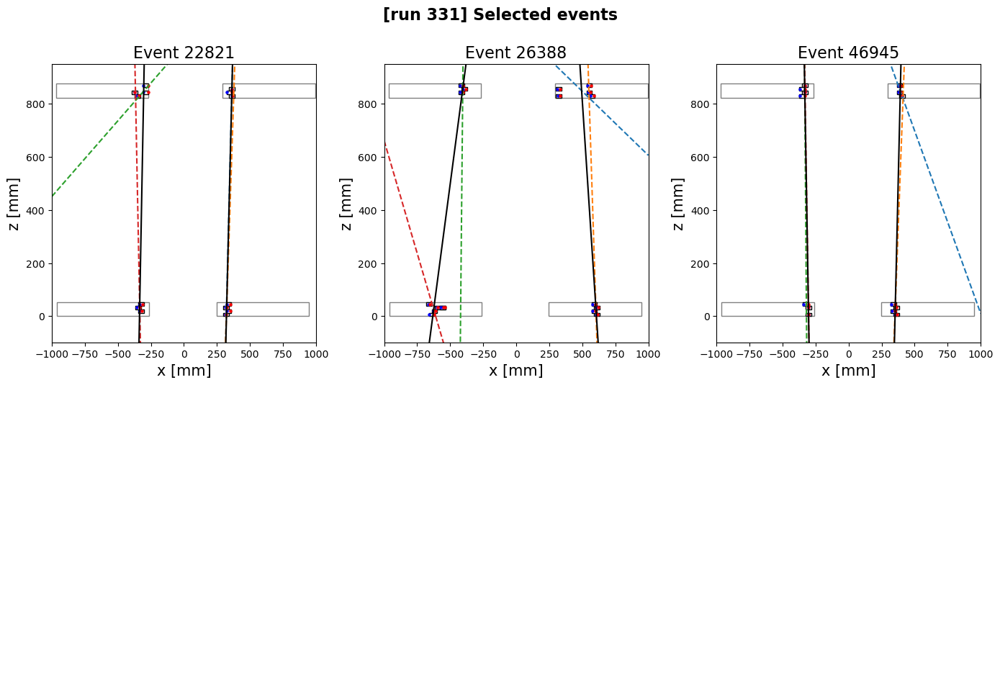

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 331] 3 TRICKY EVENTS:  [22821, 26388, 46945]
[run 331] Input events: 3
[run 331] Post-fit selected events: 0
[run 331] Percentage of input events showing good agreements between local and global fit: 0.0%
[run 331] Percentage w.r.t. original dataset size: 0.0%
[run 332] The total number of events in the original datatset is: 41286
[run 332] The percentage of the null events (events with 0 hits) w.r.t. the original amount of events is: 20.40158891633968%


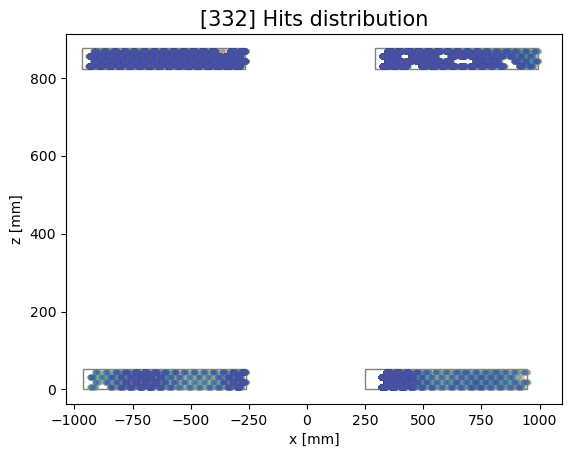

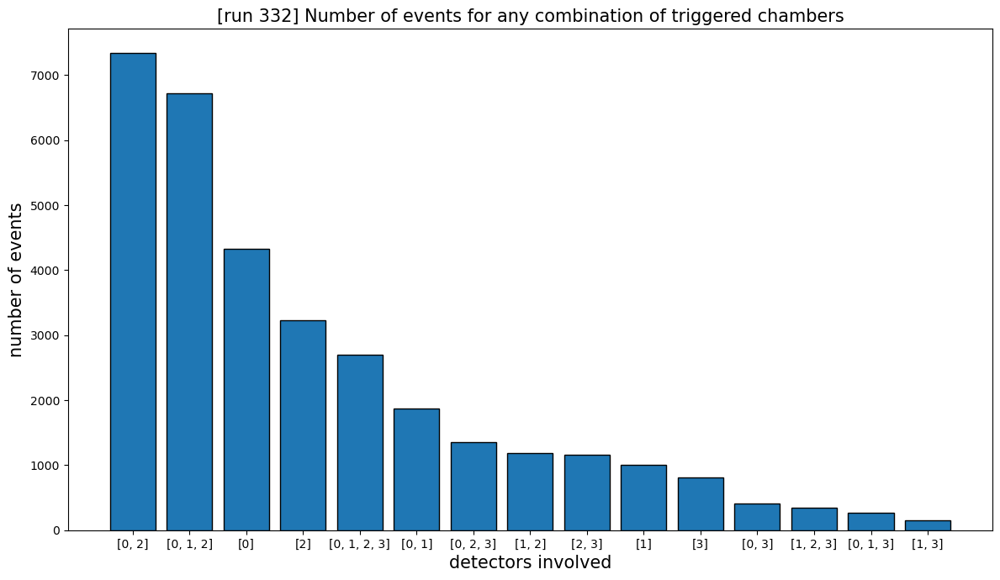

[run 332] Average number of hits per event: 12.80777774396738
[run 332] Most frequent number of hits per event 1



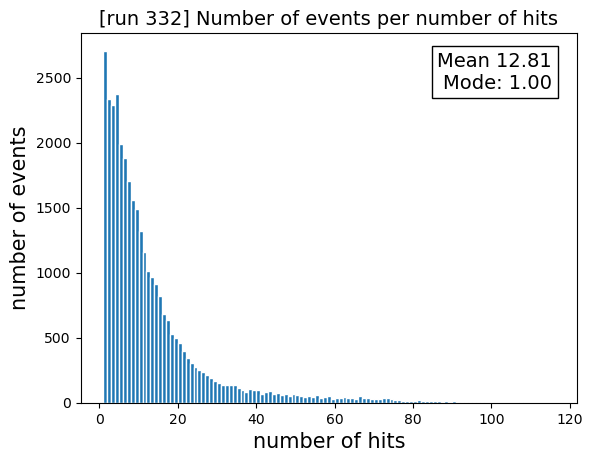

[run 332] Average number of hits per event: 37.142011834319526
[run 332] Most frequent number of hits per event 13



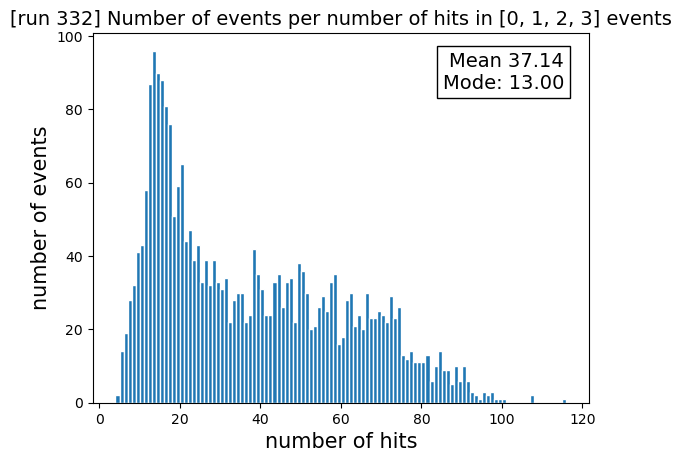

[run 332] Partial yield 8.22809846940328%
 Global yield 6.549435644043985%
[run 332] Partial yield 15.421597633136095%
 Global yield 1.010027612265659%
[run 332] Partial yield 13.42925659472422%
 Global yield 0.1356391997287216%


/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 332] 5 TRICKY EVENTS:  [8859, 17959, 21230, 51595, 54041]
[run 332] Input events: 56
[run 332] Post-fit selected events: 51
[run 332] Percentage of input events showing good agreements between local and global fit: 91.07142857142857%
[run 332] Percentage w.r.t. original dataset size: 0.12352855689580003%


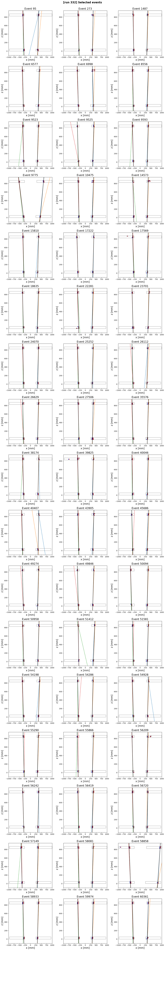

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


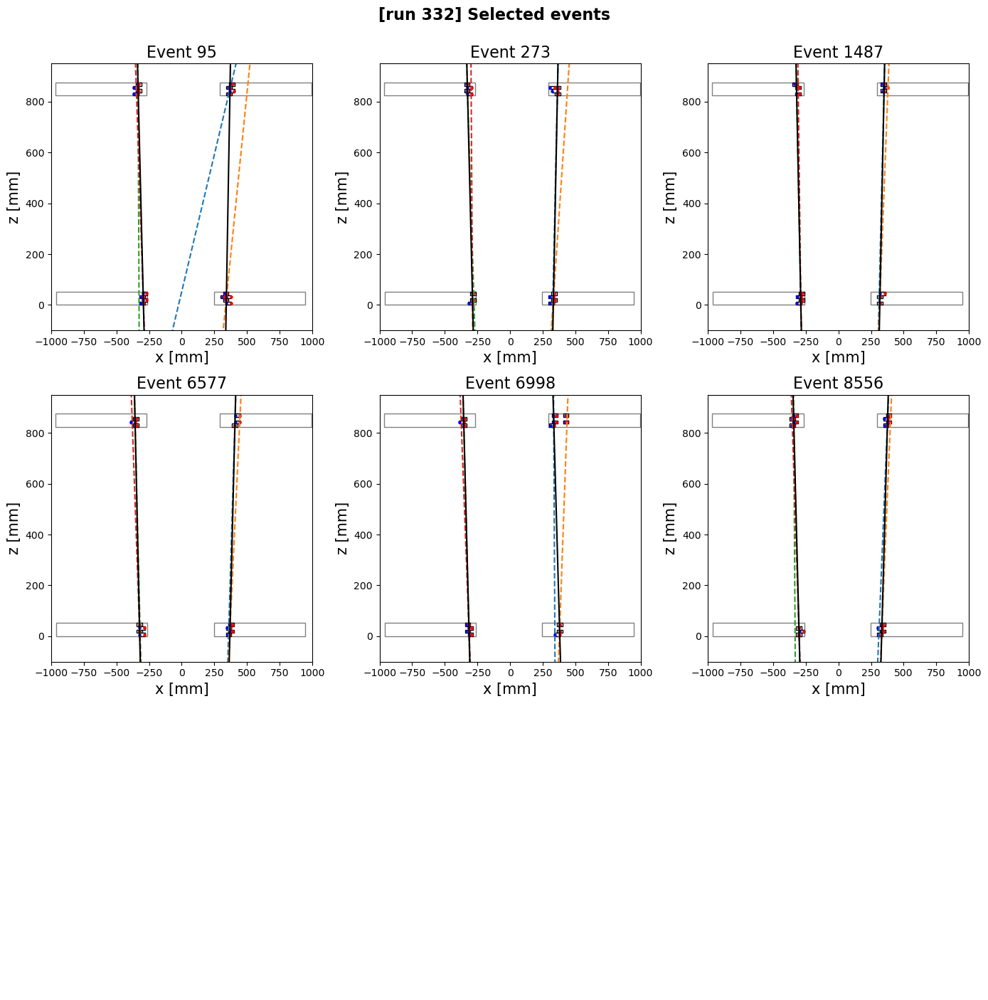

[run 332] Events considered uncertain after comparison of local and global fitting


/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


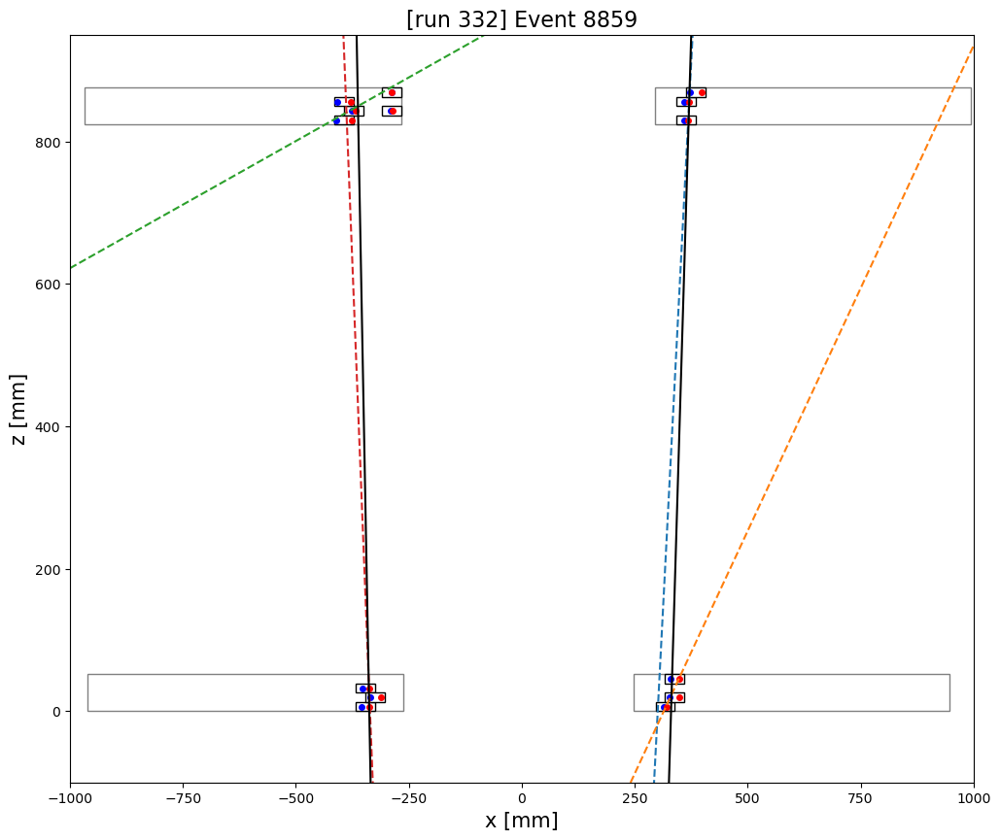

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


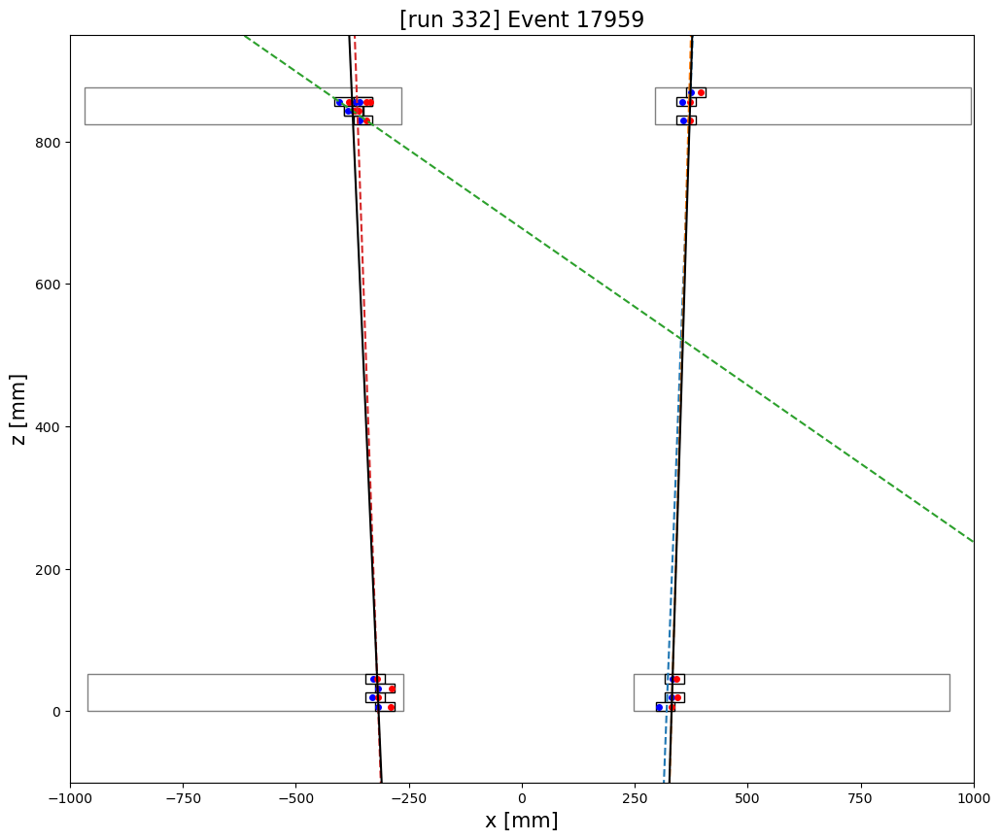

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


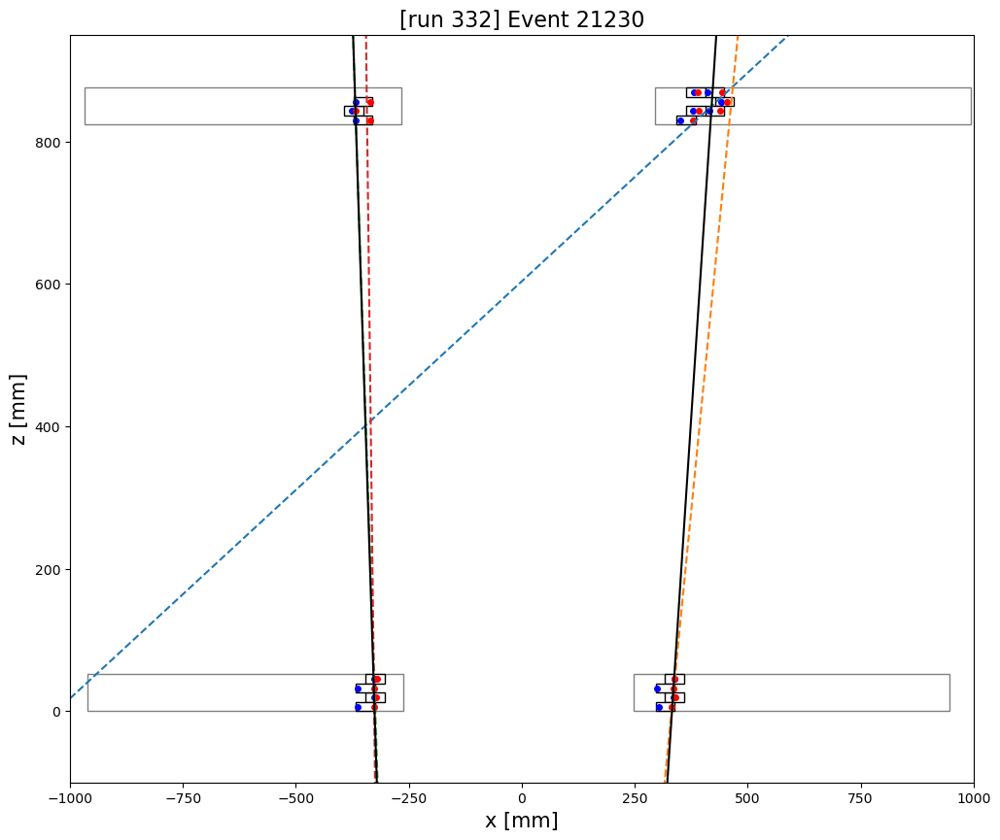

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


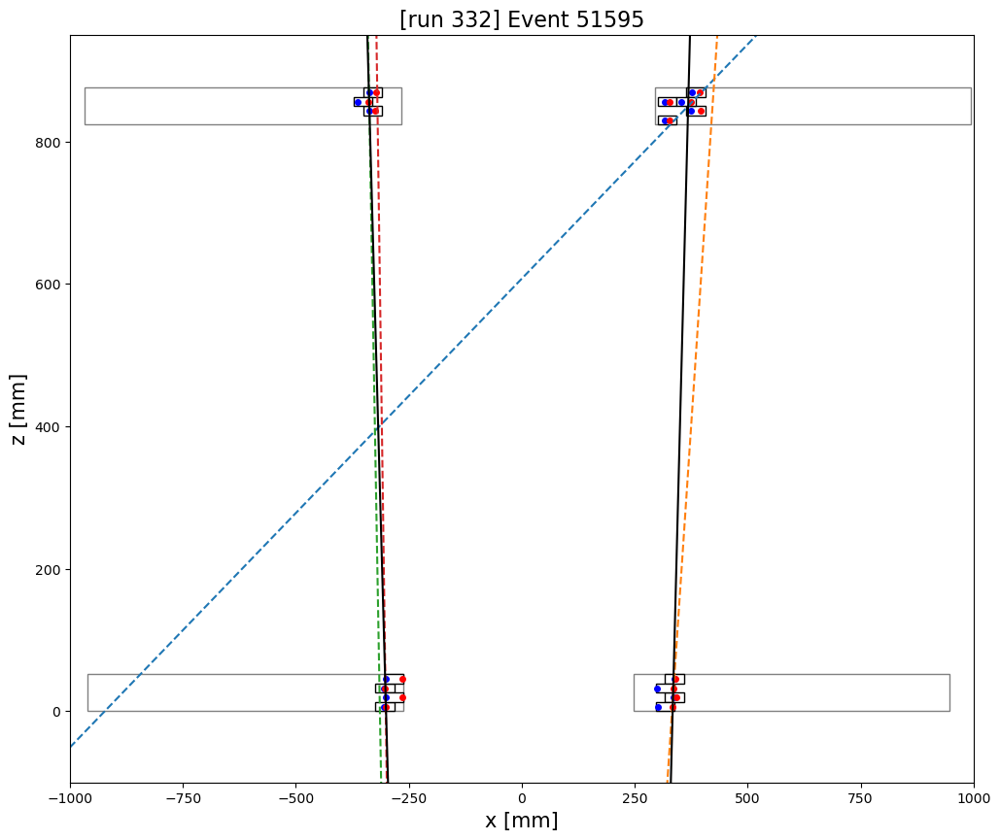

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


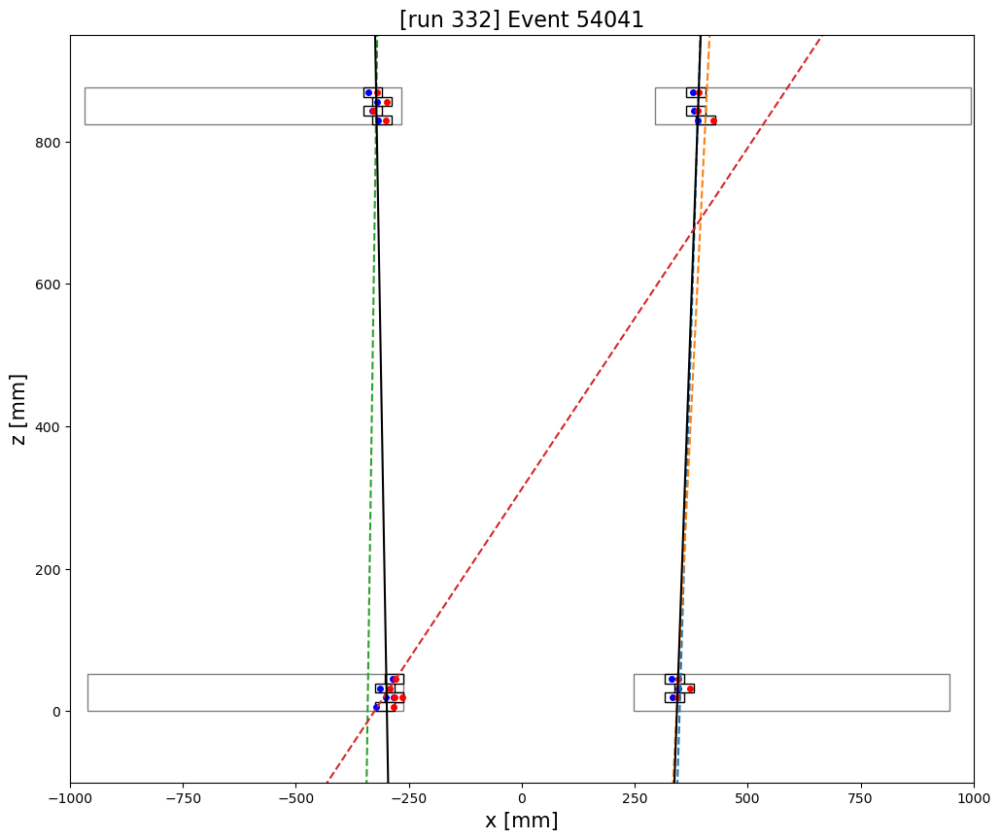

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


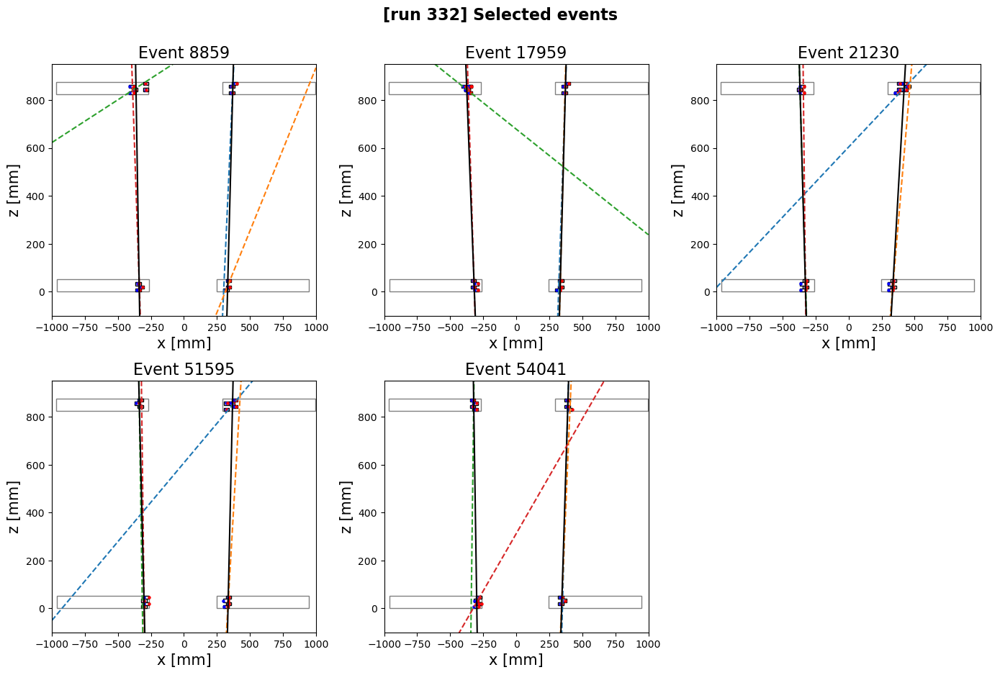

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 332] 3 TRICKY EVENTS:  [8859, 21230, 51595]
[run 332] Input events: 5
[run 332] Post-fit selected events: 2
[run 332] Percentage of input events showing good agreements between local and global fit: 40.0%
[run 332] Percentage w.r.t. original dataset size: 0.004844257133168629%


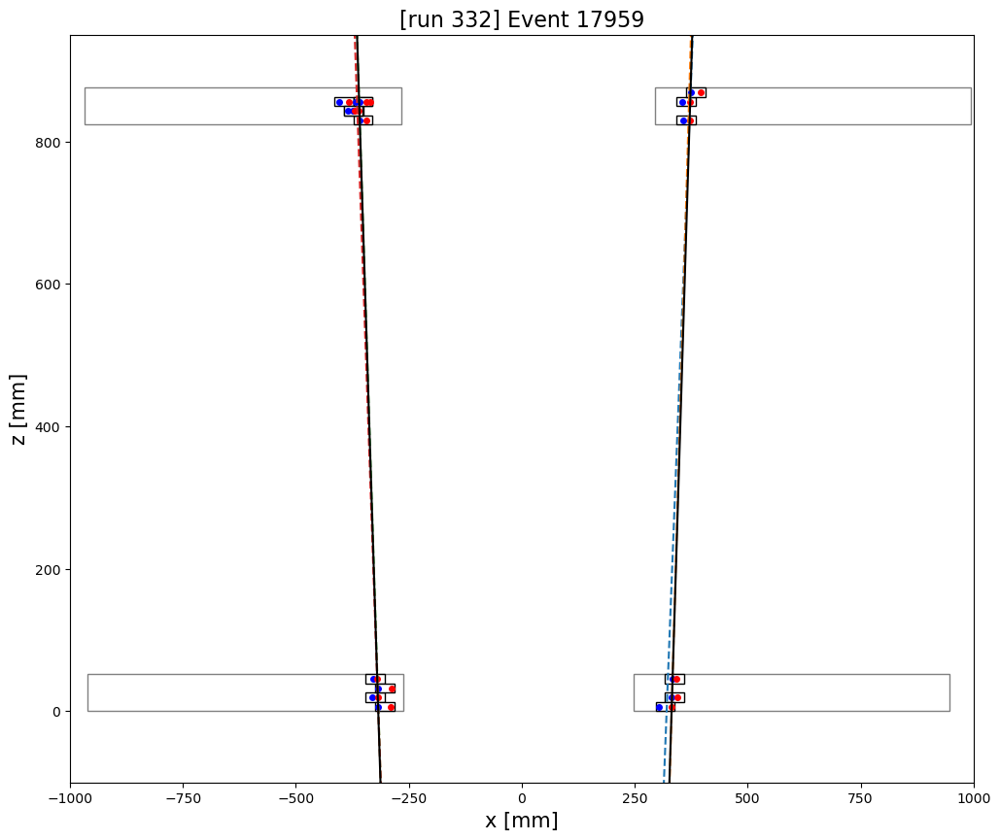

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


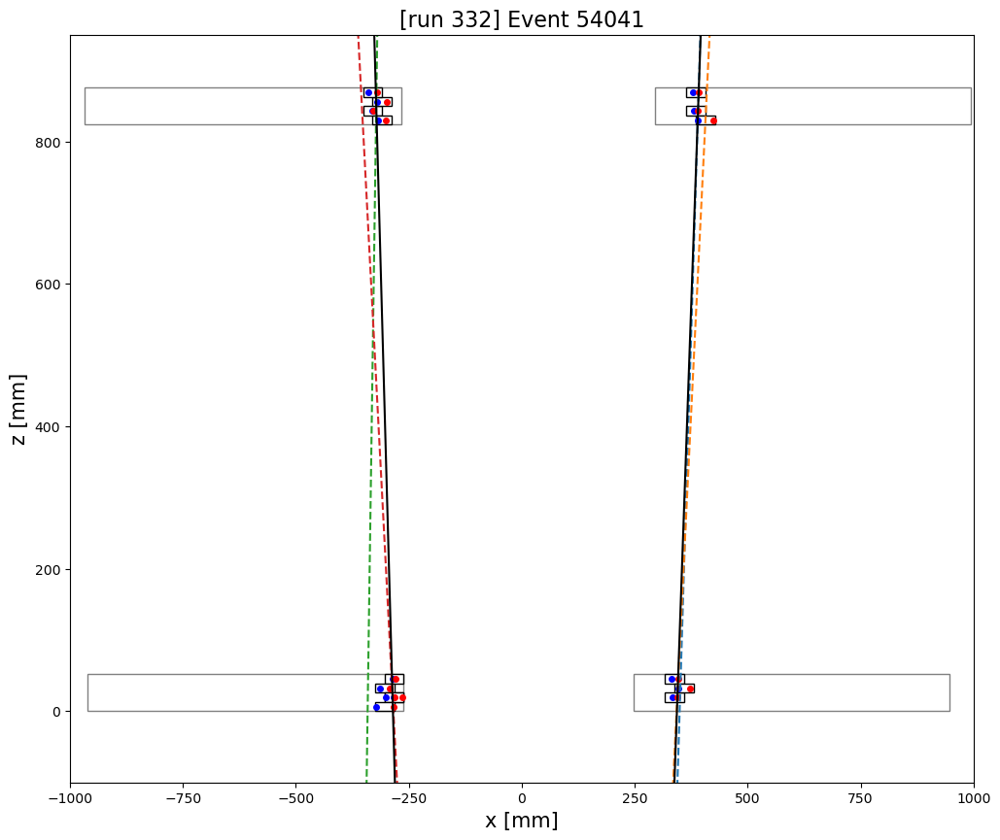

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


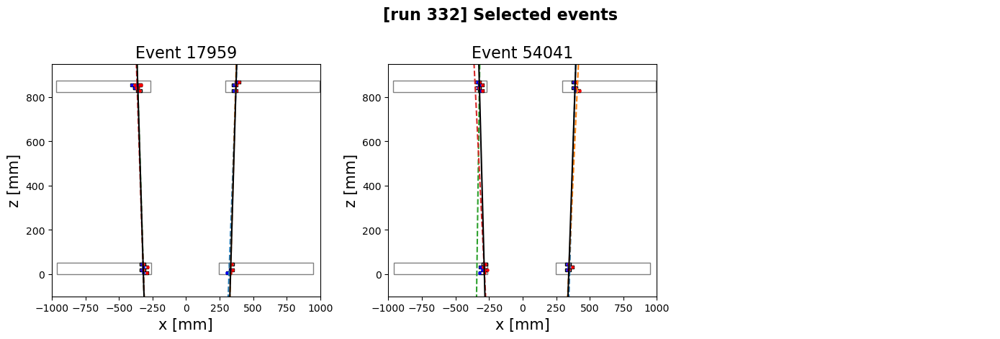

[run 333] The total number of events in the original datatset is: 60200
[run 333] The percentage of the null events (events with 0 hits) w.r.t. the original amount of events is: 24.66279069767442%


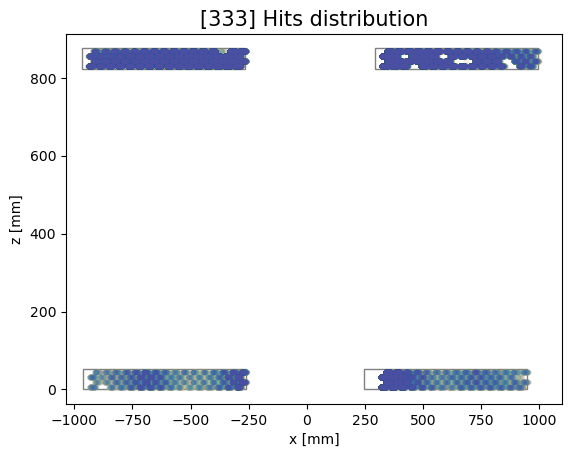

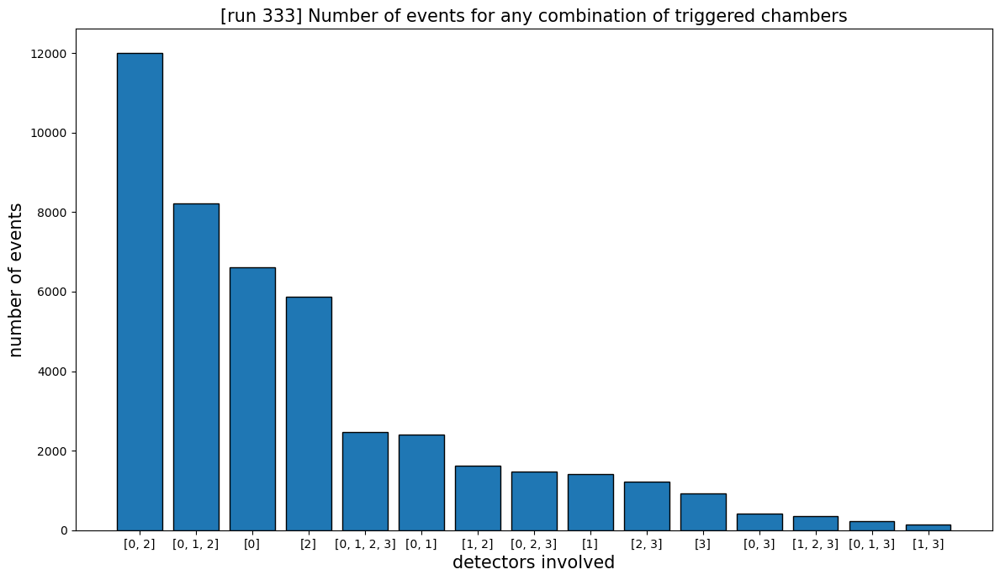

[run 333] Average number of hits per event: 11.087359160364255
[run 333] Most frequent number of hits per event 1



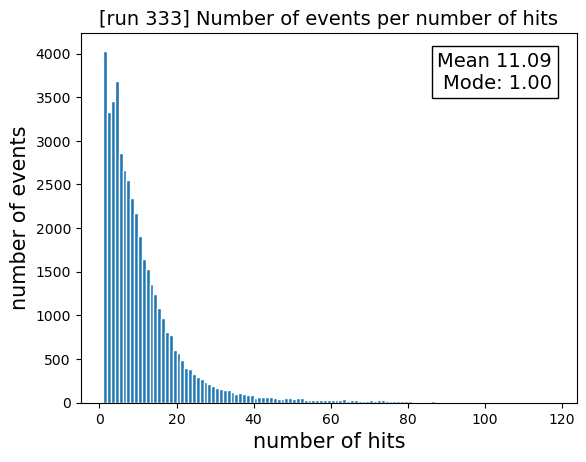

[run 333] Average number of hits per event: 34.57728194726166
[run 333] Most frequent number of hits per event 15



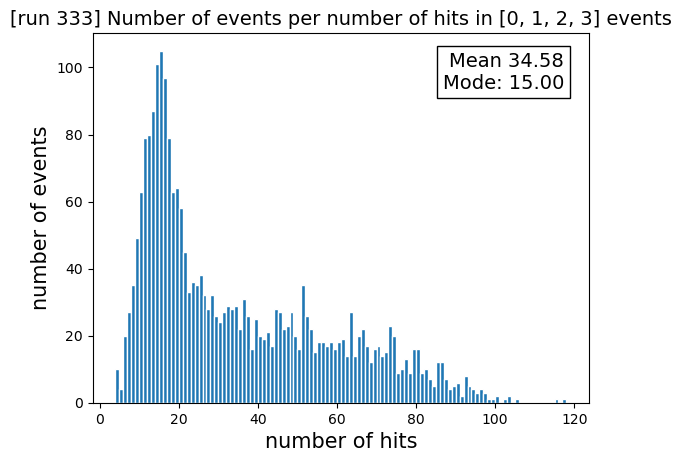

[run 333] Partial yield 5.435142107468083%
 Global yield 4.0946843853820605%
[run 333] Partial yield 21.54158215010142%
 Global yield 0.8820598006644519%
[run 333] Partial yield 19.58568738229755%
 Global yield 0.17275747508305647%


/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 333] 4 TRICKY EVENTS:  [3237, 5893, 36928, 57822]
[run 333] Input events: 104
[run 333] Post-fit selected events: 100
[run 333] Percentage of input events showing good agreements between local and global fit: 96.15384615384616%
[run 333] Percentage w.r.t. original dataset size: 0.16611295681063123%


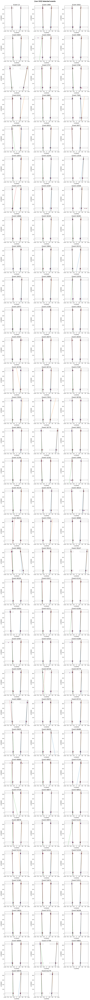

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


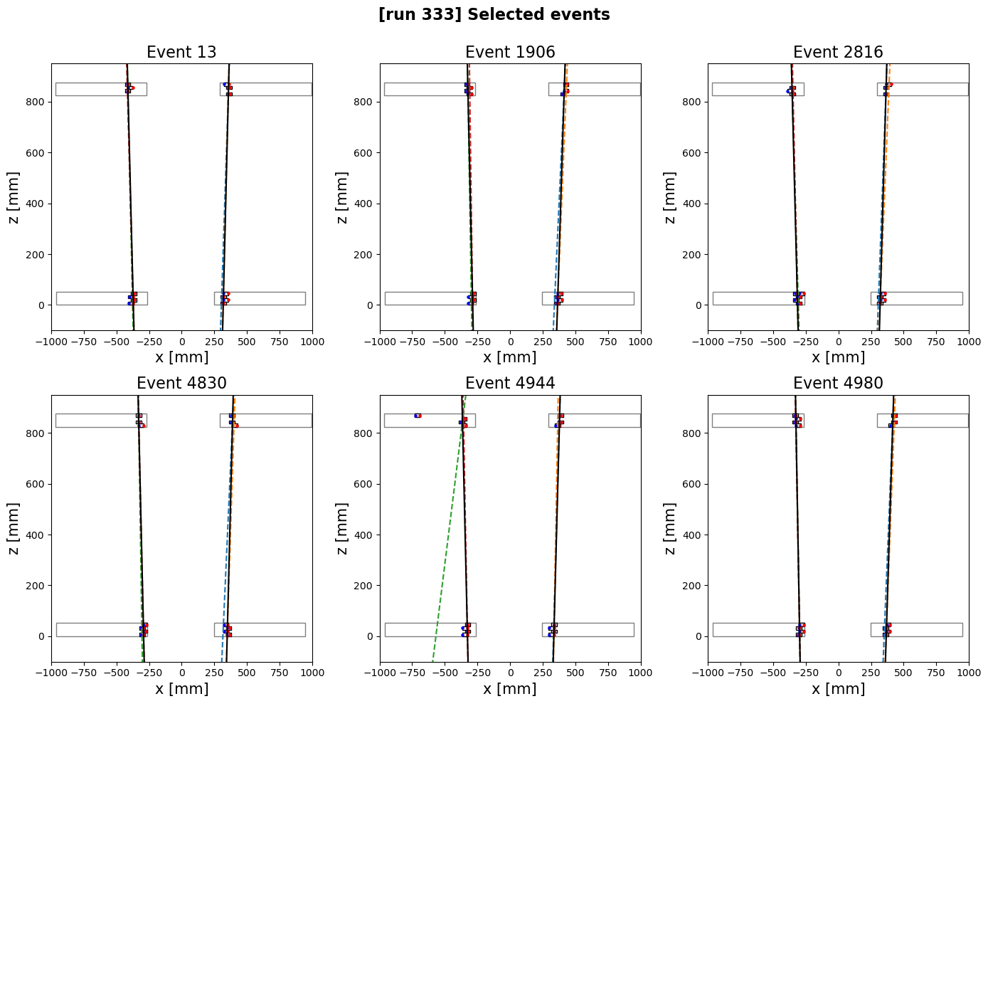

[run 333] Events considered uncertain after comparison of local and global fitting


/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


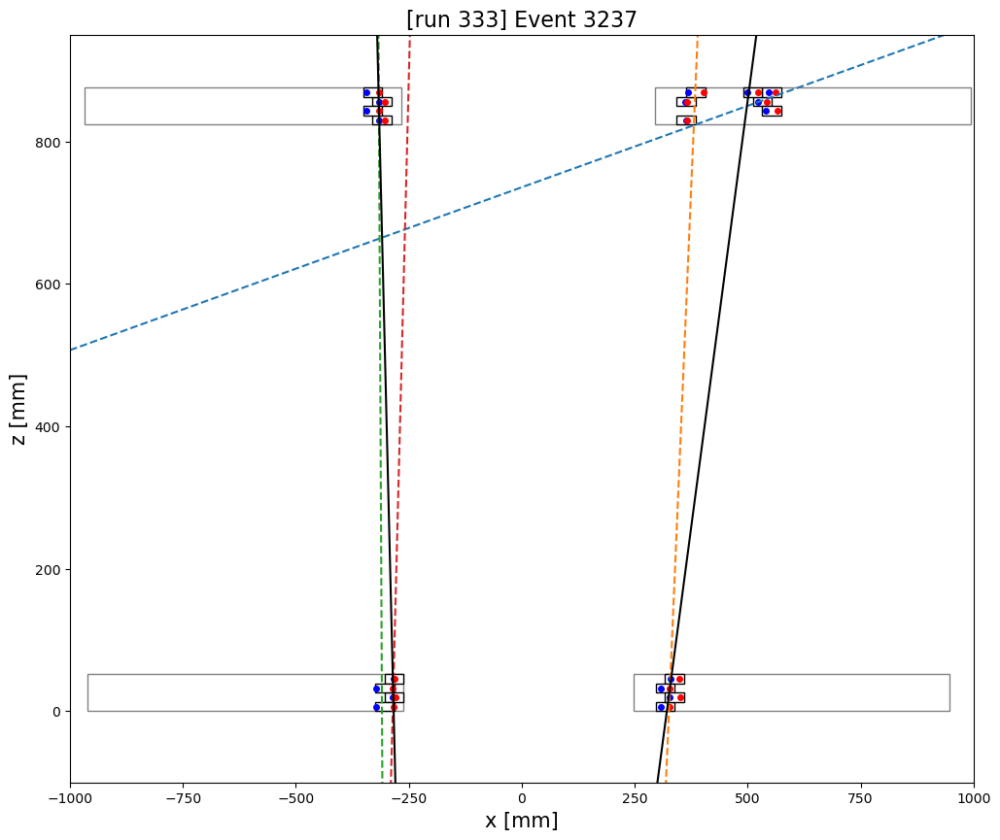

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


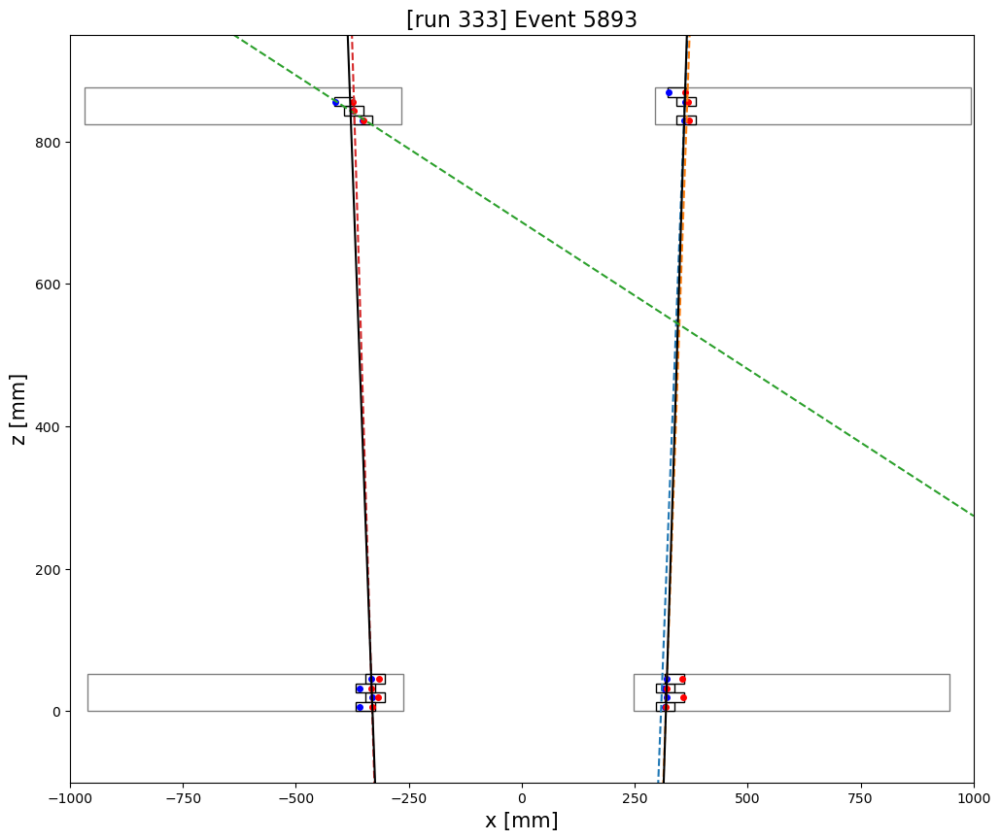

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


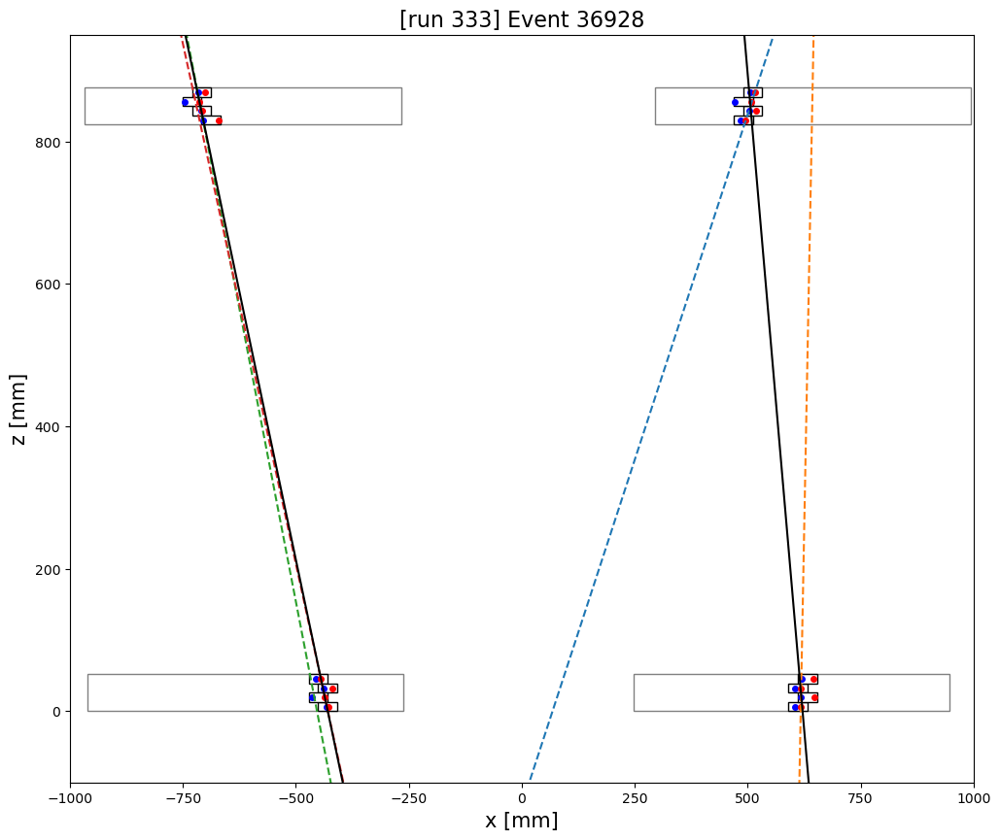

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


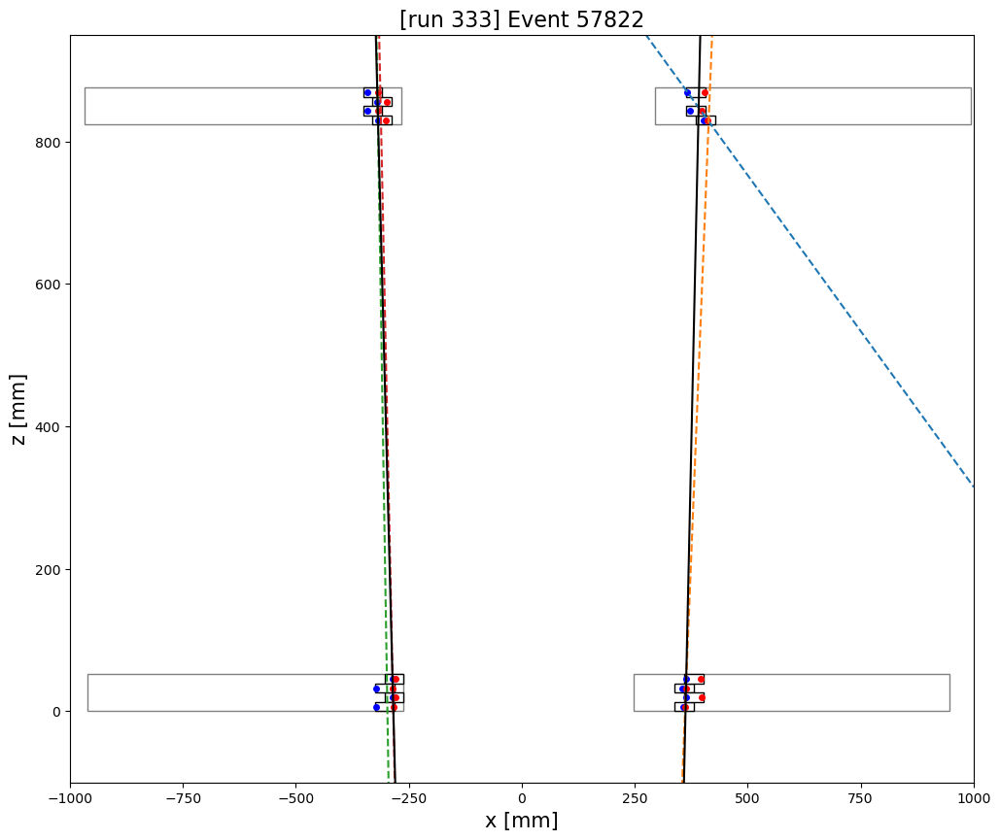

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


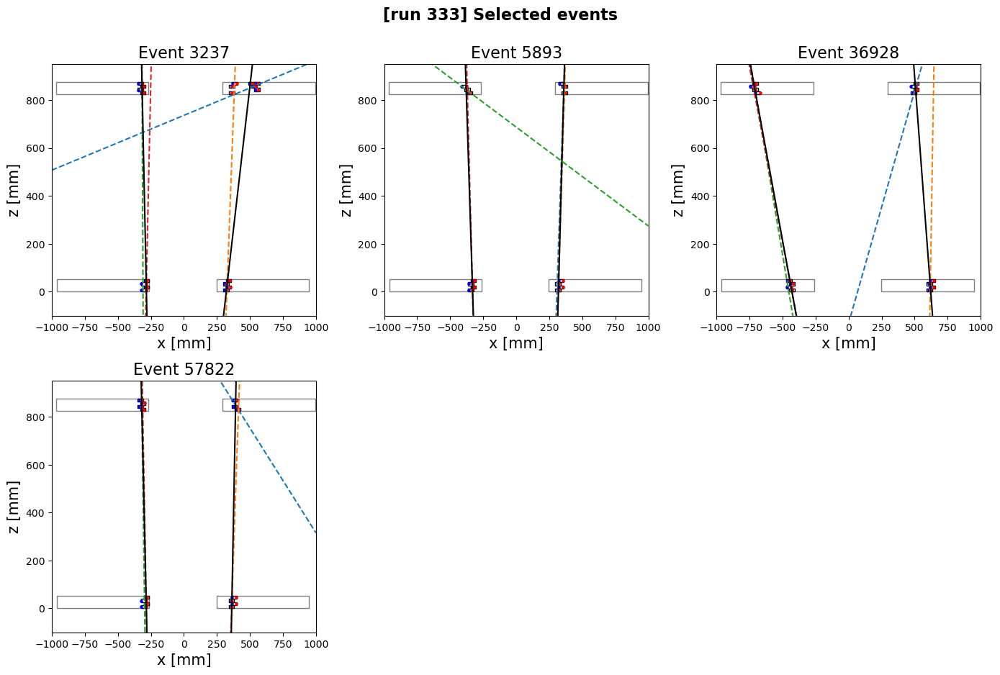

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


[run 333] 3 TRICKY EVENTS:  [3237, 5893, 36928]
[run 333] Input events: 4
[run 333] Post-fit selected events: 1
[run 333] Percentage of input events showing good agreements between local and global fit: 25.0%
[run 333] Percentage w.r.t. original dataset size: 0.0016611295681063123%


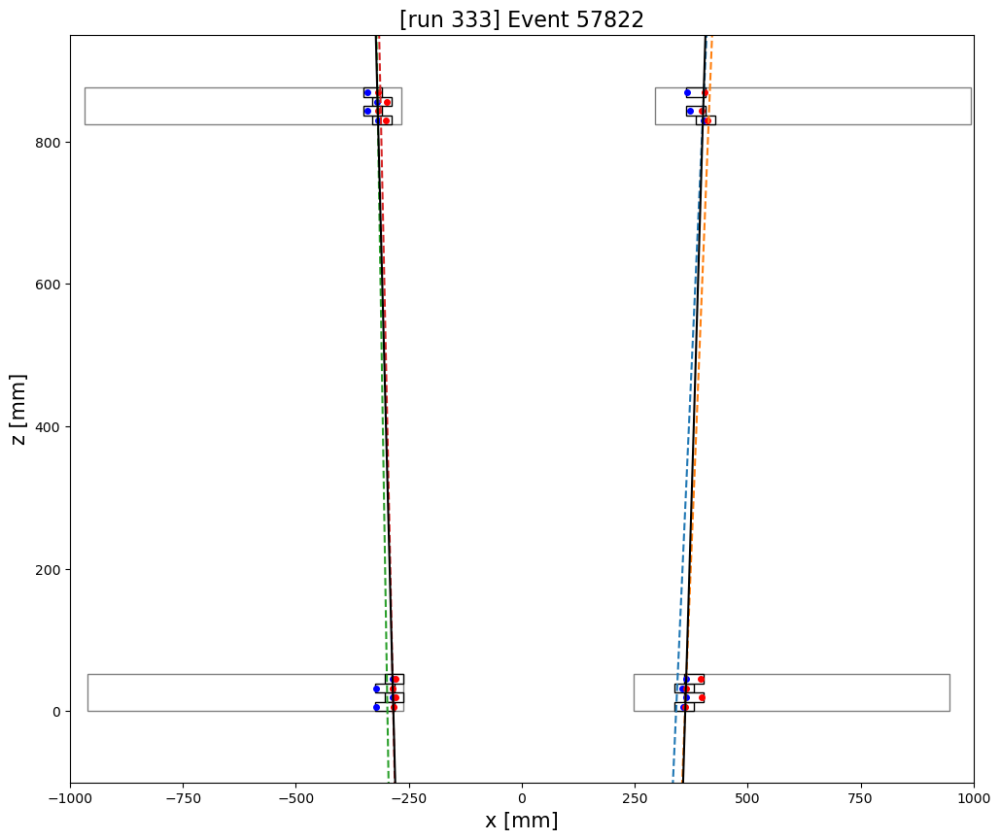

/tmp/ipykernel_10403/1493421018.py:70: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  valid_subevent=event[event['chamber']==chamber][event['valid_hit']==True]
/tmp/ipykernel_10403/1493421018.py:76: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  for index, row in valid_subevent[event['layer']==layer].iterrows():


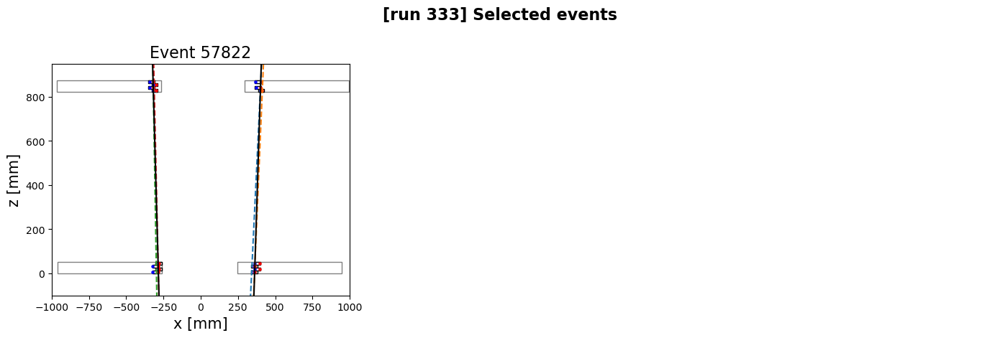

In [34]:
savefolder='physics_plots'+str(int(time()))
os.mkdir(savefolder)
parentsavefolder=savefolder


for run in [run331, run332,run333]:
    data_dict260=data_dict_of_run(run)
    additional_columns(run)
    
    savefolder=os.path.join(parentsavefolder,'part1')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    hits_distribution(run)
    plot_event_per_chamber_config(run)
    plot_n_hits_per_event(run)
    plot_n_hits_per_event(run, only_chamber_config=True)

    chamber_config=run['chamber_config']
    data_dict=run['data_dict']
    original_data_length=run['odl']

    selected_events=event_filter(run['data_dict'].keys(), desired_chamber_config, run)
    selected_events=event_filter(selected_events, max_two_layers_with_more_than_one_hit, run)
    #selected_events=event_filter(selected_events, max_one_hit_per_layer, run)
    hit_filter(selected_events, coordinates_outside_cell, run)
    hit_filter(selected_events, deviant_hit, run)
    selected_events=event_filter(selected_events, at_least_three_layers_per_det, run)
    VERTICALITY_WEIGHT=0
    good_events, tricky_events = good_and_tricky_events_filter_from_fit(selected_events)

    savefolder=os.path.join(parentsavefolder,'good')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    multiple_plotter(good_events)
    multiple_plotter(good_events, max_number=6)

    print(f'[run {run["name"]}] Events considered uncertain after comparison of local and global fitting')

    savefolder=os.path.join(parentsavefolder,'tricky')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    for number_to_check in tricky_events:
        event_plotter(number_to_check)
    multiple_plotter(tricky_events)

    VERTICALITY_WEIGHT=10
    eventually_good_events, still_tricky_events=good_and_tricky_events_filter_from_fit(tricky_events)

    savefolder=os.path.join(parentsavefolder,'eventually_good')
    if (not os.path.exists(savefolder)): 
        os.mkdir(savefolder)

    if (len(eventually_good_events)>0):
        for number_to_check in eventually_good_events:
            event_plotter(number_to_check)
        multiple_plotter(eventually_good_events)

Observing the **Hits Distribution** plots of all the runs, we notice how a small number of cells (~10) always record 0 hits. Given the high total number of events considered, we suppose that those cells are not functioning. 

# 4. Conclusions

We  elaborated the data  in the first section of the project, after that we implemented a filtering process consisting in: a first filtering stage, a path selection, the linear fitting of the tracks and a last filtering stage. 

For the first stage, we compared the alternative filters `max_one_hit_per_layer` and `max_two_layer_with more_than_one_hit`. From this comparison we found that the latter gives us a greater number of events, therefore since the process of muon production is rare we chose the latter.

Once we selected the filter, we applied the same processing both to calibration runs and physics runs and we obtained the results that we showed in the last section.

The percentages of eventually selected events with respect to the whole original physics runs datasets are:
* run331: 0.084%;
* run332: 0.128%;
* run333: 0.168%.